<a href="https://colab.research.google.com/github/DechiWords/Python_Learn/blob/main/Visualizacion_Datos_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Datos a tratar durante todo este cuaderno

Durante todo este cuaderno de COLAB se hará uso de la base de datos recopilada por 'The Population Division of the United Nations' que consiste en el número total de inmigrantes de todo el mundo a cada uno de los 45 países así como otros metadatos pertenecientes a los países de origen de los inmigrantes.

Hacemos un uso en particular en la inmigración a Canadá y trabajaremos principalmente con el conjunto de datos que involucra a dicho país.

In [ ]:
#IMPORTAMOS PANDAS, NUMPY Y XLRD
import pandas as pd
import numpy as np

In [ ]:
df_can = pd.read_excel('https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DV0101EN/labs/Data_Files/Canada.xlsx', 
                       sheet_name="Canada by Citizenship", 
                       skiprows= range(20), 
                       skipfooter= 2) #ELIMINAMOS LAS DOS ULTIMAS FILAS

In [ ]:
df_can.rename(columns = {'RegName':'Region','OdName':'Country','AreaName':'Continent'},inplace = True)

In [ ]:
df_can.head()

,Type,Coverage,Country,AREA,Continent,REG,Region,DEV,DevName,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
0,Immigrants,Foreigners,Afghanistan,935,Asia,5501,Southern Asia,902,Developing regions,16,39,39,47,71,340,496,741,828,1076,1028,1378,1170,713,858,1537,2212,2555,1999,2395,3326,4067,3697,3479,2978,3436,3009,2652,2111,1746,1758,2203,2635,2004
1,Immigrants,Foreigners,Albania,908,Europe,925,Southern Europe,901,Developed regions,1,0,0,0,0,0,1,2,2,3,3,21,56,96,71,63,113,307,574,1264,1816,1602,1021,853,1450,1223,856,702,560,716,561,539,620,603
2,Immigrants,Foreigners,Algeria,903,Africa,912,Northern Africa,902,Developing regions,80,67,71,69,63,44,69,132,242,434,491,872,795,717,595,1106,2054,1842,2292,2389,2867,3418,3406,3072,3616,3626,4807,3623,4005,5393,4752,4325,3774,4331
3,Immigrants,Foreigners,American Samoa,909,Oceania,957,Polynesia,902,Developing regions,0,1,0,0,0,0,0,1,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,Immigrants,Foreigners,Andorra,908,Europe,925,Southern Europe,901,Developed regions,0,0,0,0,0,0,2,0,0,0,3,0,1,0,0,0,0,0,2,0,0,1,0,2,0,0,1,1,0,0,0,0,1,1


In [ ]:
#VAMOS A DEFINIR UN NUEVO DATA FRAME PARA TENER UNA MEJOR LECTURA DE LOS DATOS

df_canada = pd.concat( [df_can.loc[:,['Continent','Region','DevName']],df_can.iloc[:,9:]], axis = 1)
df_canada = pd.concat( [df_canada,pd.DataFrame({'Total':list( sum(df_can.iloc[i,9:]) for i in range (len(df_can.index)) )})],axis = 1)
df_canada.index = list(df_can.loc[:,'Country'])
df_canada.head()

,Continent,Region,DevName,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Afghanistan,Asia,Southern Asia,Developing regions,16,39,39,47,71,340,496,741,828,1076,1028,1378,1170,713,858,1537,2212,2555,1999,2395,3326,4067,3697,3479,2978,3436,3009,2652,2111,1746,1758,2203,2635,2004,58639
Albania,Europe,Southern Europe,Developed regions,1,0,0,0,0,0,1,2,2,3,3,21,56,96,71,63,113,307,574,1264,1816,1602,1021,853,1450,1223,856,702,560,716,561,539,620,603,15699
Algeria,Africa,Northern Africa,Developing regions,80,67,71,69,63,44,69,132,242,434,491,872,795,717,595,1106,2054,1842,2292,2389,2867,3418,3406,3072,3616,3626,4807,3623,4005,5393,4752,4325,3774,4331,69439
American Samoa,Oceania,Polynesia,Developing regions,0,1,0,0,0,0,0,1,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,6
Andorra,Europe,Southern Europe,Developed regions,0,0,0,0,0,0,2,0,0,0,3,0,1,0,0,0,0,0,2,0,0,1,0,2,0,0,1,1,0,0,0,0,1,1,15


#Matplotlib

Matplotlib es la librería más famosa y usada en Python, fue creada por John Hunter quien era neurobiólogo.

##Arquitectura de Matplotlib

La arquitectura de Matplotlib se compone de tres capas principales:

1. La capa back-end

2. La capa artistica

3. La capa script

**Capa back-end**

La capa back-end tiene tres clases de interfaz incorporadas:

1. FigureCanvas : Define y abarca el área en la que se dibuja la figura

```
matplotlib.backend_bases.FigureCanvas
```

2. Renderer : Define el lienzo de FigureCanvas

```
matplotlib.backend_bases.Renderer
```

3. Event : Maneja las entradas del usuario, como pulsaciones del teclado y clics del mouse.

```
matplotlib.backend_bases.Event
```


**Capa artística**

La capa artística se compone de un objeto principal

1. Objeto «Artist»

El «Artist» sabe tomar el Renderer y usarlo para poner tinta en el lienzo.

Ejemplos de este componente son:

* Título

* Líneas

* Etiquetas de marca

* Imágenes

Cada una de las anteriores son objetos «Artist» individuales.

Existen dos tipos de objetos «Artist».

1. «Artist primitive» : Son objetos tipo líneas, rectángulos, circulos o texto.

2. «Artist compositive» : Son objetos tipo ejes, figura, puntos.

El objeto de Matplotlib de nivel superior que contiene y gestiona todos los elementos en un gráfico dado es la **figura** (Figure) y el «Artist compositive» más relevante son los **ejes** porque es donde la mayoría de los métodos de trazado se basan.

Es relevante mencionar que cada «Artist compositive» puede contener otros objetos «Artist».

***EJEMPLO***

In [ ]:
#VAMOS A GENERAR UN HISTOGRAMA USANDO LA CAPA «Artist»

#NOTA : backend_agg importa la geometria antigrano, biblioteca de alto rendimiento

from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas #Importamos FigureCanvas
from matplotlib.figure import Figure #Importamos Figure Artist

fig = Figure()
canvas = FigureCanvas(fig)

In [ ]:
#GENERAMOS LOS NUMEROS ALEATORIOS DE UNA DISTRIBUCION NORMAL

from random import normalvariate

x = list(normalvariate(0,1) for i in range (10000))

In [ ]:
#CREAMOS EL EJE DE LA CAPA «Artist compositive»

ax = fig.add_subplot(111)

In [ ]:
#GENERAMOS EL HISTOGRAMA

ax.hist(x,100) #EL SEGUNDO ARGUMENTO INDICA EL NUMERO DE INTERVALOS

(array([  1.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   3.,   2.,
          5.,   4.,   3.,   4.,   4.,  13.,   8.,   6.,  11.,  13.,  19.,
         18.,  26.,  26.,  26.,  40.,  39.,  63.,  70.,  70.,  83., 104.,
        105., 146., 160., 162., 170., 181., 205., 199., 206., 217., 270.,
        240., 281., 277., 285., 304., 313., 295., 355., 302., 292., 335.,
        320., 282., 291., 293., 256., 244., 226., 201., 203., 189., 181.,
        167., 146., 131., 126., 121.,  86.,  80.,  77.,  63.,  55.,  55.,
         46.,  32.,  31.,  27.,  25.,  14.,   8.,   4.,  10.,  12.,  14.,
          8.,   4.,   4.,   0.,   1.,   0.,   3.,   0.,   0.,   1.,   0.,
          1.]),
 array([-4.12332673e+00, -4.04404112e+00, -3.96475550e+00, -3.88546989e+00,
        -3.80618428e+00, -3.72689866e+00, -3.64761305e+00, -3.56832744e+00,
        -3.48904183e+00, -3.40975621e+00, -3.33047060e+00, -3.25118499e+00,
        -3.17189937e+00, -3.09261376e+00, -3.01332815e+00, -2.93404253e+00,
        -2.854

In [ ]:
#LE AGREGAMOS TITULO

ax.set_title('Distribucion normal $\mu = 0,\sigma = 1$')

#GUARDAMOS EL GRAFICO PUES NO SE MUESTRA

fig.savefig('matplotlib_histograma_capa_artist.png')

Trabajar por definición de la cara «Artist» no es óptima pues requiere de mucho proceso de sintaxis, para ello usamos el adjunto **pyplot** para simplificar el trabajo anterior y utilizar de una manera más eficiente el apartado «Artist».

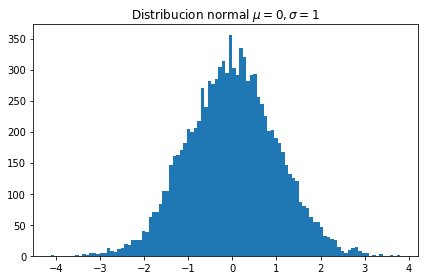

In [ ]:
#VAMOS A GENERAR EL MISMO HISTOGRAMA PERO CON pyplot

import matplotlib.pyplot as plt

plt.hist(x,bins = 100)
plt.title('Distribucion normal $\mu = 0,\sigma = 1$')
plt.tight_layout()

## Módulo pyplot

La librería matplotlib contiene la función pyplot que vemos es un conector de las distintas capas de la librería matplotlib, de aquí en adelante para realizar los gráficos se importa primero matplotlib y después pyplot.

In [ ]:
import matplotlib.pyplot as plt

Detalles estéticos como títulos, texto y demás son tomados como vistos, por lo tanto si el lector desea conocer este tipo de detalles se anexa los siguientes links que le rediriguen a páginas con dicha información.

[Representación gráfica de funciones y datos en Python][1]

[1]: http://research.iac.es/sieinvens/python-course/source/matplotlib.html

[Cómo graficar con Matplotlib][2]

[2]: https://freeshell.de/~rgh/arch/python/python-matplotlib.pdf

##Conocer la lista completa de colores disponibles en Matplotlib

Si deseamos tener una lista completa de los colores disponibles en Matplotlib ejecutamos el siguiente código.

In [ ]:
import matplotlib
for name, hex in matplotlib.colors.cnames.items():
    print(name, hex)

aliceblue #F0F8FF
antiquewhite #FAEBD7
aqua #00FFFF
aquamarine #7FFFD4
azure #F0FFFF
beige #F5F5DC
bisque #FFE4C4
black #000000
blanchedalmond #FFEBCD
blue #0000FF
blueviolet #8A2BE2
brown #A52A2A
burlywood #DEB887
cadetblue #5F9EA0
chartreuse #7FFF00
chocolate #D2691E
coral #FF7F50
cornflowerblue #6495ED
cornsilk #FFF8DC
crimson #DC143C
cyan #00FFFF
darkblue #00008B
darkcyan #008B8B
darkgoldenrod #B8860B
darkgray #A9A9A9
darkgreen #006400
darkgrey #A9A9A9
darkkhaki #BDB76B
darkmagenta #8B008B
darkolivegreen #556B2F
darkorange #FF8C00
darkorchid #9932CC
darkred #8B0000
darksalmon #E9967A
darkseagreen #8FBC8F
darkslateblue #483D8B
darkslategray #2F4F4F
darkslategrey #2F4F4F
darkturquoise #00CED1
darkviolet #9400D3
deeppink #FF1493
deepskyblue #00BFFF
dimgray #696969
dimgrey #696969
dodgerblue #1E90FF
firebrick #B22222
floralwhite #FFFAF0
forestgreen #228B22
fuchsia #FF00FF
gainsboro #DCDCDC
ghostwhite #F8F8FF
gold #FFD700
goldenrod #DAA520
gray #808080
green #008000
greenyellow #ADFF2F


## Función plot

La función plot es una función que nos ayuda a graficar líneas, puntos, marcadores, etc.

Sintaxis.

```
plt.plot(x,y)
```

La función plot recibe más argumentos, el siguiente link contiene dicha información.

[matplotlib.pyplot.plot][1]

[1]:https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html


***EJEMPLO***

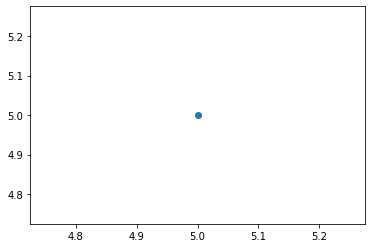

In [ ]:
#GRAFICAMOS UN PUNTO
plt.plot(5,5,'o')

## Función subplot

Para mostrar dos gráficos en uno mismo usamos subplot.
Dentro de los argumentos de subplot se introduce un número con tres dígitos.

El **primer** dígito indica el número de filas a dividir la figura.

El **segundo** dígito indica el número de columnas a dividir la figura.

El **tercer** dígito indica el gráfico en el que estamos trabajando.

Sí queremos representar, por ejemplo, tres gráficas una alado de la otra entonces tenemos una fila con tres columnas.

Sintaxis.

```
plt.subplot(##1)
p1 = plt.plot(X1,Y1, color = 'Color')
(Aquí usted decide si al gráfico 1 añadir titulo, nombre de ejes, etc.)
p2 = plt.plot(X2,Y2, color = 'Color')
(Aquí usted decide si al gráfico 2 añadir titulo, nombre de ejes, etc.)
...
plt.tight_layout()
```

Existe otra forma de crear subplot's.

Sintaxis.

```
fig = plt.figure() #crea imagen
ax = fig.add_subplot(Filas,Columnas,Numero_Grafica)
```

Donde Filas es el número de filas, Columnas es el número de columnas y Numero_Grafica es la gráfica a dibujar.


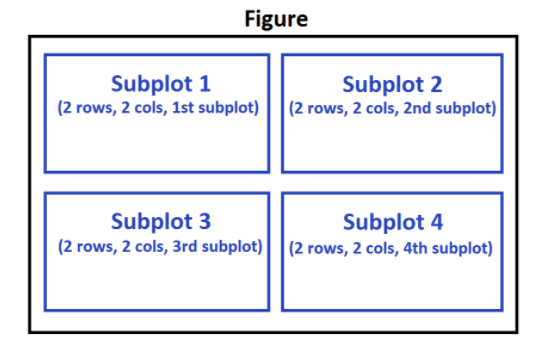

Notemos que $y_1,y_2$ corresponde a los ejes de cada gráfico, en este caso, el gráfico 1 y 2, así mismo los ejes $x_1,x_2$. 

Piense a subplot como una división del código para graficar. Despues de cada subplot usted introduce lo que se añade a dicho gráfico.

La función tight_layout nos ayuda ajustar los gráficos para evitar sobreposiciones.

Para más información dar click en el siguiente link.

[Representación gráfica de funciones y datos][1]

[1]: http://research.iac.es/sieinvens/python-course/source/matplotlib.html#varias-ventanas-de-graficos

Para ver un ejemplo ir a 

«Gráfico de burbuja usando pandas»

## Gráfico de línea

Un gráfico de línea es un grafico en forma de una serie de puntos de datos conectados por segmentos de línea recta.

El mejor caso para un diagrama de linea es cuando tiene un conjunto de datos continuo y está interesado en visualizar los datos durante un período de tiempo.

Sintaxis.

```
plt.plot(x,y)
```

Donde $x,y$ son listas que contienen los valores correspondientes a cada eje.

***EJEMPLO***

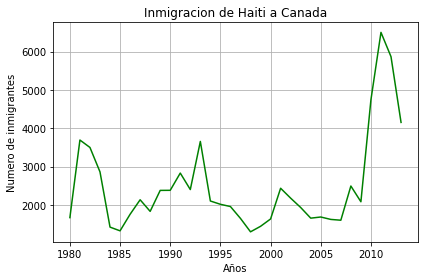

In [ ]:
#SUPONGA QUE QUEREMOS VER LA INMIGRACION DE Haiti A Canada DESDE 1980 HASTA 2013
Eje_X = list(Year for Year in range (1980,2014))
Eje_Y = list( df_canada.loc['Haiti',list(Year for Year in range (1980,2014))][w] for w in range (1980,2014) )
plt.plot(Eje_X, Eje_Y,color = 'green')
plt.title('Inmigracion de Haiti a Canada')
plt.xlabel('Años')
plt.ylabel('Numero de inmigrantes')
plt.grid()
plt.tight_layout()

Notemos que automáticamente Pyhon asigna al eje de las $x$ los índices y al eje $y$ los valores de las columnas individuales.

### Como forzar a generar los gráficos dentro del cuaderno

Sí nuestro gráfico se genera en una ventana externa podemos obligar al cuaderno a mostrarlo dentro de este mediante la función «magic».

Sintaxis.

```
%matplotlib inline
import matplotlib.pyplot as plt
...
```


Una limitación de este método es que no podemos modificar la figura una vez está hecha. Por lo cual si necesitamos una figura nueva tendríamos que generar un nuevo gráfico.

Para superar esta limitación podemos usar la función «magic» aplicada al cuaderno.

Sintaxis.

```
%matplotlib notebook
```

Lo que hace esto es que cuando mandamos a llamar la función *plt* verifica sí existe una figura activa la traerá así como todas las demás, si no existe la genera.

## Graficando mediante la librería pandas

La librería matplotlib está integrada en la librería pandas lo cual nos facilita la graficación de datos tipo series o Data Frames.

### Grafico de líneas usando pandas

Para realizar un gráfico de líneas mediante pandas tenemos la siguiente sintaxis.

```
DF.plot(kind = 'line')
```

Para realizar un gráfico de líneas de una sola columna tenemos la siguiente sintaxis.

Sintaxis 1.

```
DF.loc[:,'Columna'].plot(kind = 'line')
```

Sintaxis 2.

```
DF['Columna'].plot(kind = 'line')
```

***EJEMPLO***

In [ ]:
#CONSIDERE EL SIGUIENTE DATA FRAME
import pandas as pd
india_china_df = pd.DataFrame({'India':[8880,8670,8147,7338,5704],'China':[5123,6682,3308,1863,1527]},index = [1980,1981,1982,1983,1984])
india_china_df

,India,China
1980,8880,5123
1981,8670,6682
1982,8147,3308
1983,7338,1863
1984,5704,1527


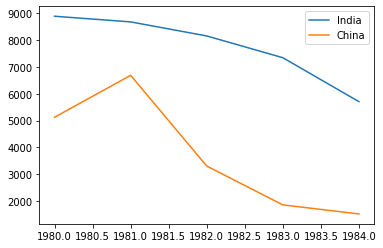

In [ ]:
#REALIZAMOS UN GRAFICO DE LINEAS DEL DATA FRAME ANTERIOR

india_china_df.plot(kind = 'line')

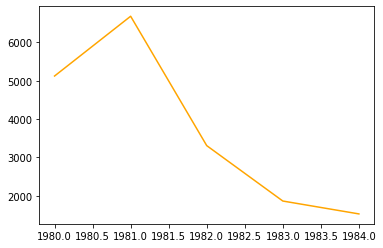

In [ ]:
#REALIZAMOS UN GRAFICO DE LINEAS DE LA COLUMNA China

india_china_df['China'].plot(kind = 'line', color = 'orange')

#### Función transpose

Recordemos que automáticamente Pyhon asigna al eje de las $x$ los índices y al eje $y$ los valores de las columnas individuales.

Por ello si mandamos a llamar un Data Frame mediante el metodo iloc o loc y queremos graficarlo pero la etiqueta es un dato tipo str y las columnas valores entonces tendremos un gráfico no deseado, por ello usamos la función transpose para poder hacer la transpuesta del Data Frame y asignar de manera correcta las posiciones a la gráfica.

Sintaxis.

```
DF = DF.transpose()
```


***EJEMPLO***

In [ ]:
#SUPONGAMOS QUE QUEREMOS VER LA INMIGRACION DE CHINA E INDIA A CANADA
df_CI = df_canada.loc[['China','India'],list(Year for Year in range (1980,2014))]
df_CI

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
China,5123,6682,3308,1863,1527,1816,1960,2643,2758,4323,8076,14255,10846,9817,13128,14398,19415,20475,21049,30069,35529,36434,31961,36439,36619,42584,33518,27642,30037,29622,30391,28502,33024,34129
India,8880,8670,8147,7338,5704,4211,7150,10189,11522,10343,12041,13734,13673,21496,18620,18489,23859,22268,17241,18974,28572,31223,31889,27155,28235,36210,33848,28742,28261,29456,34235,27509,30933,33087


In [ ]:
#NOTEMOS QUE LOS INDICES SON NOMBRES Y NO SON DATOS NUMERICOS, APLICAMOS LA FUNCION transpose
#Y ASI PODER GRAFICAR CON LINEAS LA INMIGRACION DESEADA A ANALIZAR
df_CI = df_CI.transpose()
df_CI.head()

,China,India
1980,5123,8880
1981,6682,8670
1982,3308,8147
1983,1863,7338
1984,1527,5704


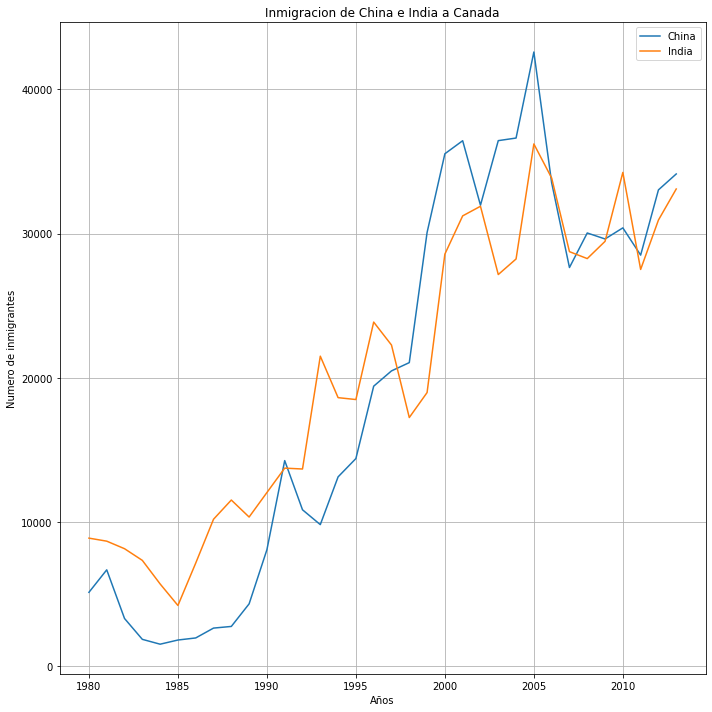

In [ ]:
df_CI.plot(kind = 'line',figsize = (10,10))
plt.title('Inmigracion de China e India a Canada')
plt.xlabel('Años')
plt.ylabel('Numero de inmigrantes')
plt.grid()
plt.tight_layout()

***EJEMPLO***

In [ ]:
#COMPAREMOS LA TENDENCIA DE LOS PRIMEROS 5 PAISES QUE APARECEN EN LA LISTA
df_top5 = df_canada.iloc[0:5,3:]
df_top5.drop(columns = 'Total',inplace = True)
df_top5

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Afghanistan,16,39,39,47,71,340,496,741,828,1076,1028,1378,1170,713,858,1537,2212,2555,1999,2395,3326,4067,3697,3479,2978,3436,3009,2652,2111,1746,1758,2203,2635,2004
Albania,1,0,0,0,0,0,1,2,2,3,3,21,56,96,71,63,113,307,574,1264,1816,1602,1021,853,1450,1223,856,702,560,716,561,539,620,603
Algeria,80,67,71,69,63,44,69,132,242,434,491,872,795,717,595,1106,2054,1842,2292,2389,2867,3418,3406,3072,3616,3626,4807,3623,4005,5393,4752,4325,3774,4331
American Samoa,0,1,0,0,0,0,0,1,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
Andorra,0,0,0,0,0,0,2,0,0,0,3,0,1,0,0,0,0,0,2,0,0,1,0,2,0,0,1,1,0,0,0,0,1,1


In [ ]:
#LOS INDICES SON NOMBRES Y NO LAS FECHAS, POR LO TANTO USAMOS LA FUNCION transpose
df_top5 = df_top5.transpose()
df_top5.head(5)

,Afghanistan,Albania,Algeria,American Samoa,Andorra
1980,16,1,80,0,0
1981,39,0,67,1,0
1982,39,0,71,0,0
1983,47,0,69,0,0
1984,71,0,63,0,0


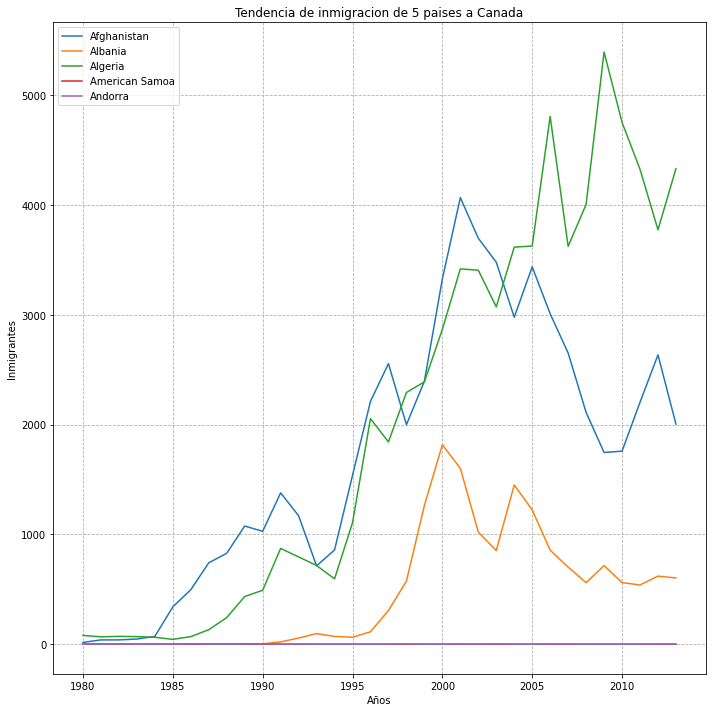

In [ ]:
df_top5.plot(kind = 'line',figsize = (10,10))
plt.title('Tendencia de inmigracion de 5 paises a Canada')
plt.xlabel('Años')
plt.ylabel('Inmigrantes')
plt.grid(linestyle = '--')
plt.tight_layout()

### Gráfico de área usando pandas

Un gráfico de área, también conocido en inglés como 'area chart', es un tipo de diagrama que representa los totales acumulados usando números o porcentajes en el tiempo.

Se basa en el gráfico de línea y se usa comunmente cuando se trata de comparar dos o más cantidades.

Sintaxis.

```
DF.plot(kind = 'area')
```

Las gráfica de área están apiladas por defecto, si deseamos una gráfica de área no apilada tenemos la siguiente sintaxis.

```
DF.plot(kind = 'area',stacked = False)
```

Las gráficas sin apilar tienen una transparencia de $\alpha = 0.5, 0\leq \alpha\leq 1$. Para modificar este valor tenemos la siguiente sintaxis.

```
DF.plot(kind = 'area',stacked = False, alpha = #)
```

***EJEMPLO***

In [ ]:
#TOMANDO LA BASE DE DATOS df_canada VAMOS A ASIGNAR A UN NUEVO DF LOS PAISES CON MAYOR
#INMIGRACION A ESTE PAIS

df_t5 = df_canada.sort_values(['Total'],ascending=False)
df_t5 = df_t5.iloc[:5,3:].drop(columns = 'Total') 
df_t5

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
India,8880,8670,8147,7338,5704,4211,7150,10189,11522,10343,12041,13734,13673,21496,18620,18489,23859,22268,17241,18974,28572,31223,31889,27155,28235,36210,33848,28742,28261,29456,34235,27509,30933,33087
China,5123,6682,3308,1863,1527,1816,1960,2643,2758,4323,8076,14255,10846,9817,13128,14398,19415,20475,21049,30069,35529,36434,31961,36439,36619,42584,33518,27642,30037,29622,30391,28502,33024,34129
United Kingdom of Great Britain and Northern Ireland,22045,24796,20620,10015,10170,9564,9470,21337,27359,23795,31668,23380,34123,33720,39231,30145,29322,22965,10367,7045,8840,11728,8046,6797,7533,7258,7140,8216,8979,8876,8724,6204,6195,5827
Philippines,6051,5921,5249,4562,3801,3150,4166,7360,8639,11865,12509,12718,13670,20479,19532,15864,13692,11549,8735,9734,10763,13836,11707,12758,14004,18139,18400,19837,24887,28573,38617,36765,34315,29544
Pakistan,978,972,1201,900,668,514,691,1072,1334,2261,2470,3079,4071,4777,4666,4994,9125,13073,9068,9979,15400,16708,15110,13205,13399,14314,13127,10124,8994,7217,6811,7468,11227,12603


In [ ]:
#COMO VAMOS A USAR plot EN UN DF NECESITAMOS QUE LOS INDICES SEAN LOS Year
df_t5 = df_t5.transpose()
df_t5.head()

,India,China,United Kingdom of Great Britain and Northern Ireland,Philippines,Pakistan
1980,8880,5123,22045,6051,978
1981,8670,6682,24796,5921,972
1982,8147,3308,20620,5249,1201
1983,7338,1863,10015,4562,900
1984,5704,1527,10170,3801,668


In [ ]:
df_t5.rename(columns = {'United Kingdom of Great Britain and Northern Ireland':'UK & NI'},inplace = True)
df_t5.head()

,India,China,UK & NI,Philippines,Pakistan
1980,8880,5123,22045,6051,978
1981,8670,6682,24796,5921,972
1982,8147,3308,20620,5249,1201
1983,7338,1863,10015,4562,900
1984,5704,1527,10170,3801,668


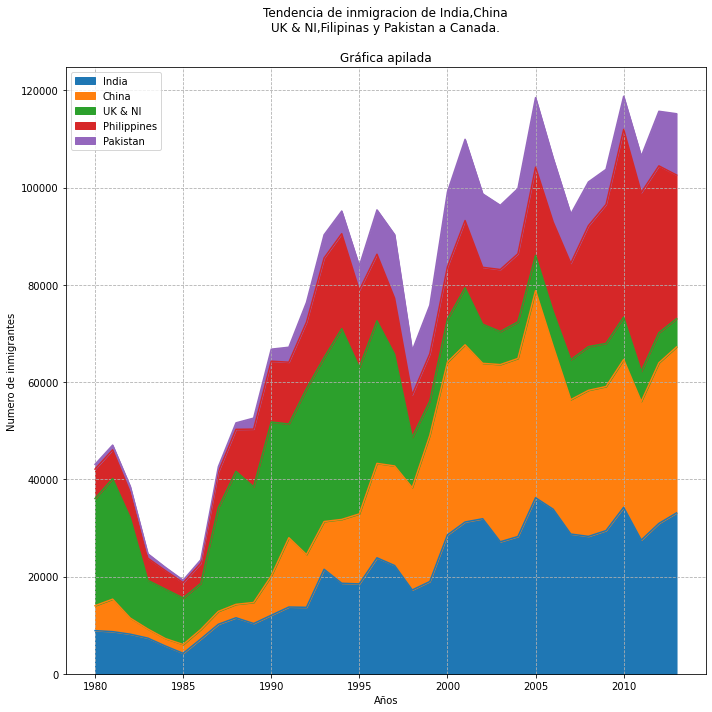

In [ ]:
df_t5.plot(kind = 'area',figsize = (10,10))
plt.title('Tendencia de inmigracion de India,China\nUK & NI,Filipinas y Pakistan a Canada.\n\nGráfica apilada')
plt.xlabel('Años')
plt.ylabel('Numero de inmigrantes')
plt.rc('legend', fontsize='small')
plt.grid(linestyle = '--')
plt.tight_layout()

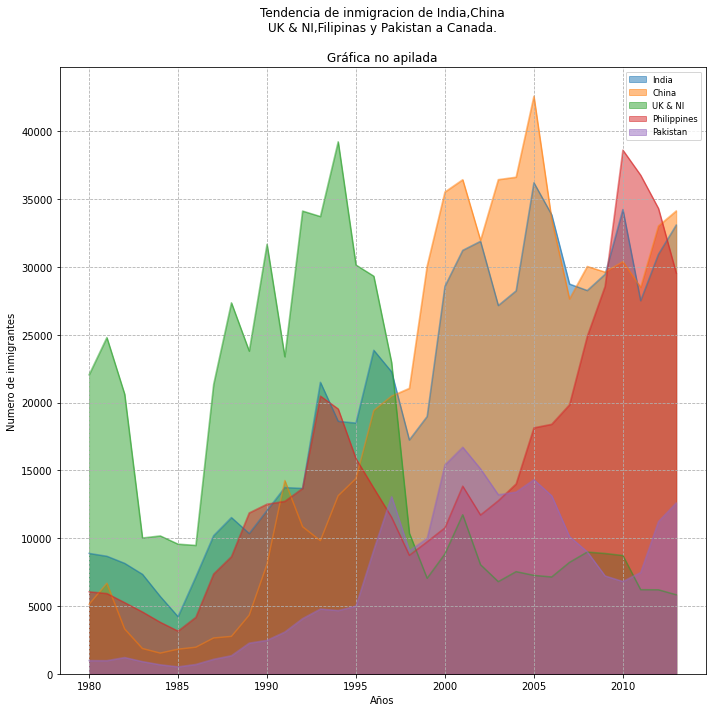

In [ ]:
df_t5.plot(kind = 'area',stacked = False,figsize = (10,10))
plt.title('Tendencia de inmigracion de India,China\nUK & NI,Filipinas y Pakistan a Canada.\n\nGráfica no apilada')
plt.xlabel('Años')
plt.ylabel('Numero de inmigrantes')
plt.rc('legend', fontsize='small')
plt.grid(linestyle = '--')
plt.tight_layout()

### Histograma usando pandas

Un histograma es una forma de representar la distribución de frecuencia de un conjunto de datos numéricos.

La forma en que funciona es que divide la propagación de los datos numéricos en intervalos (bins), asigna cada punto de datos en el conjunto de datos a un intervalo, y luego cuenta el número de puntos de datos que se han asignado a cada intervalo.

Por ello el eje de las $y$ es la frecuencia o el número de datos en cada intervalo.

Para realizar un histograma de una columna de un Data Frame mediante pandas tenemos la siguiente sintaxis.

Sintaxis 1.

```
DF.loc[:,'Columna'].plot(kind = 'hist')
```

Sintaxis 2.

```
DF['Columna'].plot(kind = 'hist')
```

***EJEMPLO***

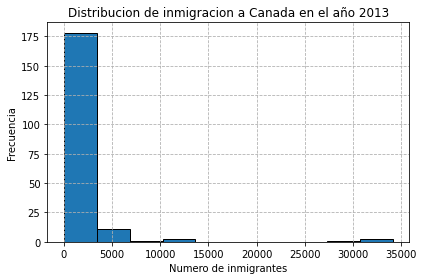

In [ ]:
#VAMOS A VISUALIZAR LA DISTRIBUCION DE INMIGRACION A CANADA EN EL AÑO 2013
df_canada.loc[:,2013].plot(kind = 'hist',edgecolor = 'black')
plt.title('Distribucion de inmigracion a Canada en el año 2013')
plt.xlabel('Numero de inmigrantes')
plt.ylabel('Frecuencia')
plt.grid(linestyle = '--')
plt.tight_layout()

Note que los intervalos no están alineados con las marcas en el eje $x$, es decir, no todos los elementos del eje están escritos.

Para solucionar este detalle hacemos uso de la librería NumPy.

La librería NumPy contiene una gráfica de histograma, haremos uso de ella para poder acomodar de manera óptima estos datos.

Sintaxis.

```
cuenta, bin_longitud = np.histogram(DF.loc[:,'Columna'])

DF.loc[:,'Columna'].plot(kind = 'hist',xticks = bin_longitud)
```

Lo que hace esta función es dividir la difusión de los datos en la columna deseada en 10 intervalos de igual ancho y asignarla a «bin_longitud», calcular el número de puntos de datos que caen en cada bin y luego devolver esta frecuencia de cada bin en la variable «cuenta»

In [ ]:
import numpy as np

In [ ]:
cuenta, bin_longitud = np.histogram(df_canada.loc[:,2013])

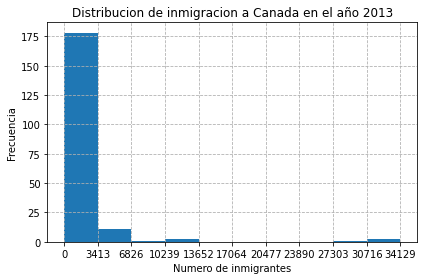

In [ ]:
df_canada.loc[:,2013].plot(kind = 'hist',xticks = bin_longitud)
plt.title('Distribucion de inmigracion a Canada en el año 2013')
plt.xlabel('Numero de inmigrantes')
plt.ylabel('Frecuencia')
plt.grid(linestyle = '--')
plt.tight_layout()

Notemos ahora que en el eje $x$ podemos leer todas las etiquetas.

***EJEMPLO***

In [ ]:
#VAMOS A GRAFICAR LA DISTRIBUCION DE INMIGRACION DE DINAMARCA, NORUEGA Y SUECIA
#DESDE 1980 A 2013 
df_den_nor_swe = df_canada.loc[['Denmark','Norway','Sweden'],list(Year for Year in range (1980,2014))]
df_den_nor_swe

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Denmark,272,293,299,106,93,73,93,109,129,129,118,111,158,186,93,111,70,83,63,81,93,81,70,89,89,62,101,97,108,81,92,93,94,81
Norway,116,77,106,51,31,54,56,80,73,76,83,103,74,92,60,65,70,104,31,36,56,78,74,77,73,57,53,73,66,75,46,49,53,59
Sweden,281,308,222,176,128,158,187,198,171,182,130,167,179,203,192,176,161,151,123,170,138,184,149,161,129,205,139,193,165,167,159,134,140,140


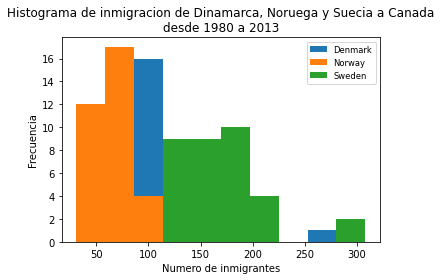

In [ ]:
#NOTEMOS QUE LOS INDICES SON NOMBRES Y NO LAS FECHAS, HACEMOS USO DE transpose
df_den_nor_swe = df_den_nor_swe.transpose()
df_den_nor_swe.plot(kind = 'hist')
plt.title('Histograma de inmigracion de Dinamarca, Noruega y Suecia a Canada\ndesde 1980 a 2013')
plt.xlabel('Numero de inmigrantes')
plt.ylabel('Frecuencia')
plt.tight_layout()

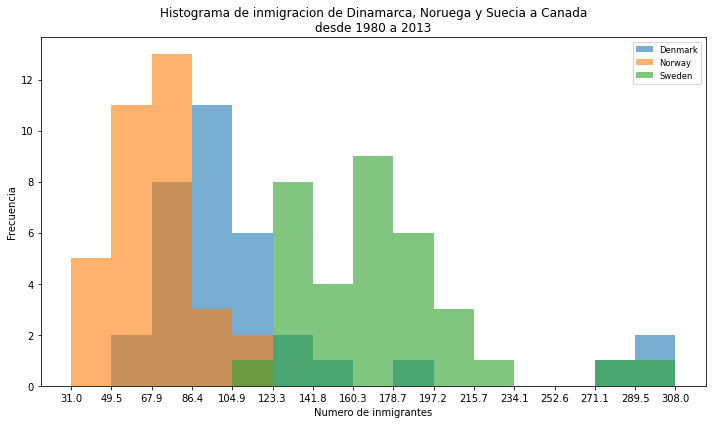

In [ ]:
#REALIZAREMOS CIERTAS MODIFICACIONES AL HISTOGRAMA PARA MEJORAR SU VISUALIZACION
#LE DAREMOS 15 INTERVALOS Y ETIQUETAREMOS TODO EL EJE X.

cuenta, bin_longitud = np.histogram(df_den_nor_swe,15) #EL SEGUNDO ARGUMENTO INDICA EL NUM DE INTERVALOS

#NOTE QUE EL EJE X QUEDABA AMONTONADO, POR TANTO INCREMENTAMOS EL TAMAÑO DEL GRAFICO

df_den_nor_swe.plot(kind = 'hist',
                    bins = 15, 
                    alpha = 0.6,
                    xticks = bin_longitud,
                    figsize = (10,6))
plt.title('Histograma de inmigracion de Dinamarca, Noruega y Suecia a Canada\ndesde 1980 a 2013')
plt.xlabel('Numero de inmigrantes')
plt.ylabel('Frecuencia')
plt.tight_layout()

Notemos que las gráficas se solapan entre ellas, podemos apilarlas usando el parámetro stacked.

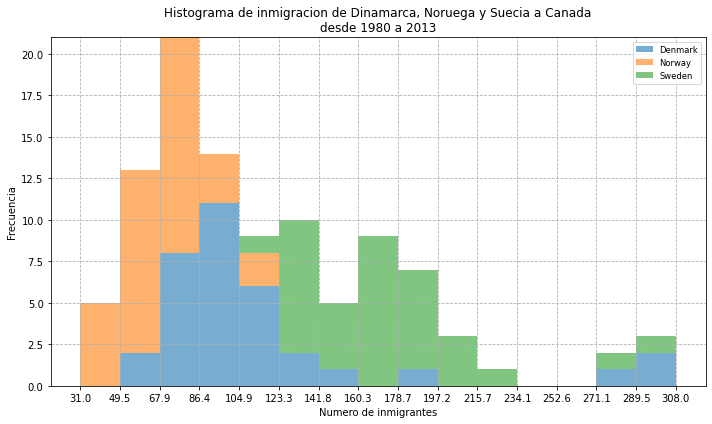

In [ ]:
df_den_nor_swe.plot(kind = 'hist',
                    bins = 15, 
                    alpha = 0.6,
                    xticks = bin_longitud,
                    figsize = (10,6),
                    stacked = True)
plt.title('Histograma de inmigracion de Dinamarca, Noruega y Suecia a Canada\ndesde 1980 a 2013')
plt.xlabel('Numero de inmigrantes')
plt.ylabel('Frecuencia')
plt.grid(linestyle = '--')
plt.tight_layout()

***EJEMPLO***

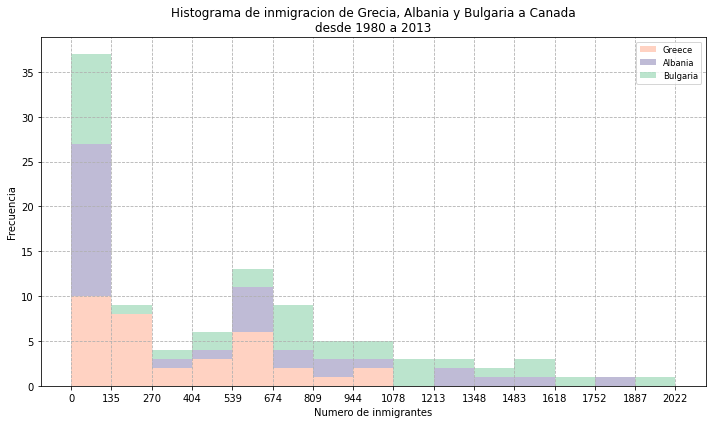

In [ ]:
#VAMOS A GRAFICAR LA DISTRIBUCION DE GRECIA, ALBANIA Y BULGARIA
df_gre_alba_bulga = df_canada.loc[['Greece','Albania','Bulgaria'], list(Year for Year in range (1980,2014))]
df_gre_alba_bulga = df_gre_alba_bulga.transpose()
count, bin_edges = np.histogram(df_gre_alba_bulga, 15)
df_gre_alba_bulga.plot(kind ='hist',
            figsize=(10, 6),
            bins=15,
            alpha=0.35,
            xticks=bin_edges,
            color=['coral', 'darkslateblue', 'mediumseagreen'],
            stacked = True
            )
plt.title('Histograma de inmigracion de Grecia, Albania y Bulgaria a Canada\ndesde 1980 a 2013')
plt.xlabel('Numero de inmigrantes')
plt.ylabel('Frecuencia')
plt.grid(linestyle = '--')
plt.tight_layout()

### Gráfico de barras usando pandas

Un gráfico de barras es un tipo de diagrama donde la longitud de cada barra es proporcional a el valor del dato que representa.

Se usa comúnmente para comparar valores de una variable en un punto dado en el tiempo.

Sintaxis.

```
DF.plot(kind = 'bar')
```

Si deseamos gráfica de barras horizontales tenemos la siguiente sintaxis.

```
DF.plot(kind = 'barh')
```


***EJEMPLO***

In [ ]:
#VAMOS A ANALIZAR LA INMIGRACION DESDE ISLANDIA A CANADA DESDE 1980 A 2013
df_iceland = df_canada.loc['Iceland',list(Year for Year in range (1980,2014)) ]

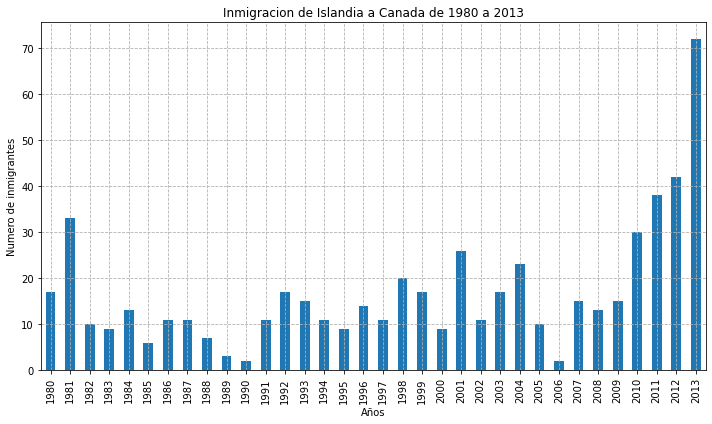

In [ ]:
#GRAFICAMOS
df_iceland.plot(kind = 'bar',figsize = (10,6))
plt.title('Inmigracion de Islandia a Canada de 1980 a 2013')
plt.xlabel('Años')
plt.ylabel('Numero de inmigrantes')
plt.grid(linestyle = '--')
plt.tight_layout()

Con las gráficas de barras es fácil ver tendencias de crecimiento o decrecimiento, por ello es posible mediante Python insertar figuras, como flechas, que indiquen esta tendencia.

***EJEMPLO***

In [ ]:
#MEDIANTE GRAFICAS HORIZONTALES ANALIZAMOS LOS 15 PAISES
#CON MAS INMIGRACION A CANADA

df_t15 = df_canada.sort_values(['Total'],ascending = False).iloc[:15,3:]
df_t15

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
India,8880,8670,8147,7338,5704,4211,7150,10189,11522,10343,12041,13734,13673,21496,18620,18489,23859,22268,17241,18974,28572,31223,31889,27155,28235,36210,33848,28742,28261,29456,34235,27509,30933,33087,691904
China,5123,6682,3308,1863,1527,1816,1960,2643,2758,4323,8076,14255,10846,9817,13128,14398,19415,20475,21049,30069,35529,36434,31961,36439,36619,42584,33518,27642,30037,29622,30391,28502,33024,34129,659962
United Kingdom of Great Britain and Northern Ireland,22045,24796,20620,10015,10170,9564,9470,21337,27359,23795,31668,23380,34123,33720,39231,30145,29322,22965,10367,7045,8840,11728,8046,6797,7533,7258,7140,8216,8979,8876,8724,6204,6195,5827,551500
Philippines,6051,5921,5249,4562,3801,3150,4166,7360,8639,11865,12509,12718,13670,20479,19532,15864,13692,11549,8735,9734,10763,13836,11707,12758,14004,18139,18400,19837,24887,28573,38617,36765,34315,29544,511391
Pakistan,978,972,1201,900,668,514,691,1072,1334,2261,2470,3079,4071,4777,4666,4994,9125,13073,9068,9979,15400,16708,15110,13205,13399,14314,13127,10124,8994,7217,6811,7468,11227,12603,241600
United States of America,9378,10030,9074,7100,6661,6543,7074,7705,6469,6790,5892,6054,6842,7435,5901,4890,5515,4753,4437,5196,5433,5604,4948,5543,6990,8394,9613,9463,10190,8995,8142,7676,7891,8501,241122
Iran (Islamic Republic of),1172,1429,1822,1592,1977,1648,1794,2989,3273,3781,3655,6250,6814,3959,2785,3956,6205,7982,7057,6208,5884,6169,8129,5918,6348,5837,7480,6974,6475,6580,7477,7479,7534,11291,175923
Sri Lanka,185,371,290,197,1086,845,1838,4447,2779,2758,3525,7266,13102,9563,7150,9368,6484,5415,3566,4982,6081,5861,5279,4892,4495,4930,4714,4123,4756,4547,4422,3309,3338,2394,148358
Republic of Korea,1011,1456,1572,1081,847,962,1208,2338,2805,2979,2087,2598,3790,3819,3005,3501,3250,4093,4938,7108,7618,9619,7342,7117,5352,5832,6215,5920,7294,5874,5537,4588,5316,4509,142581
Poland,863,2930,5881,4546,3588,2819,4808,6931,9211,16025,17040,16028,12145,6960,3550,2405,2136,1758,1488,1354,1471,1601,1447,1394,1533,1405,1263,1235,1267,1013,795,720,779,852,139241


In [ ]:
#NOS ENFOCAMOS SOLAMENTE EN EL TOTAL DE CADA PAIS
df_t15 = df_t15.loc[:,'Total']
df_t15

India                                                   691904
China                                                   659962
United Kingdom of Great Britain and Northern Ireland    551500
Philippines                                             511391
Pakistan                                                241600
United States of America                                241122
Iran (Islamic Republic of)                              175923
Sri Lanka                                               148358
Republic of Korea                                       142581
Poland                                                  139241
Lebanon                                                 115359
France                                                  109091
Jamaica                                                 106431
Viet Nam                                                 97146
Romania                                                  93585
Name: Total, dtype: int64

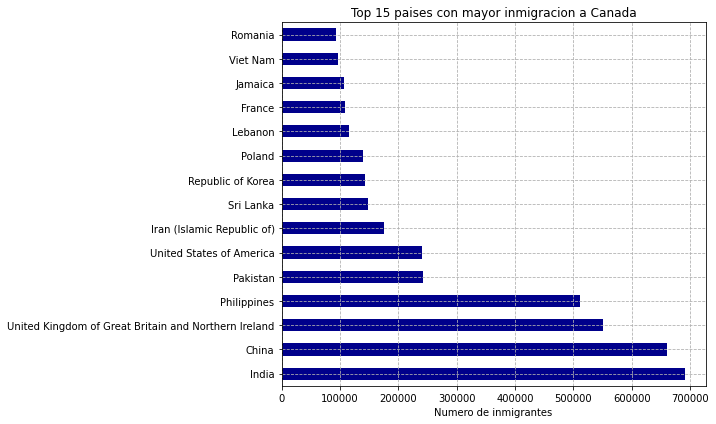

In [ ]:
#GRAFICAMOS
df_t15.plot(kind = 'barh',figsize = (10,6), color = 'darkblue')
plt.xlabel('Numero de inmigrantes')
plt.title('Top 15 paises con mayor inmigracion a Canada')
plt.grid(linestyle = '--')
plt.tight_layout()

Notemos que para gráficas de barras horizontales no usamos la función transpose.

#### Función annotate

La función annotate nos ayuda a agregar anotaciones a las gráficas.

El siguiente link contiene más información respecto a las anotaciones en Matplotlib.

[Matplotlib annotate][1]

[1]: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html

La función annotate recibe los siguientes parámetros.

|Parámetro|Descripción|
|--|--|
|s|El texto de la anotación|
|xy|Tupla para especificar el punto $(x,y)$ a ser anotado|
|xytext|Tupla para especificar el punto $(x,y)$ donde colocar el texto|
|xycoords|El sistema de coordenadas $xy$ dado, generalmente se le asigna 'data'|
|arrowprops|Toma un diccionario de propiedades para dibujar la flecha|

A su vez el diccionario arrowprops tiene los siguientes parámetros.

|Parámetro|Descripción|
|--|--|
|arrowstyle|Especifica el estilo de la flecha, '->' es la estandar|
|connectionstyle|Especifica el tipo de conexión, arc3 significa línea recta|
|color|Color de la flecha|
|lw|Ancho de la flecha|

***EJEMPLO***

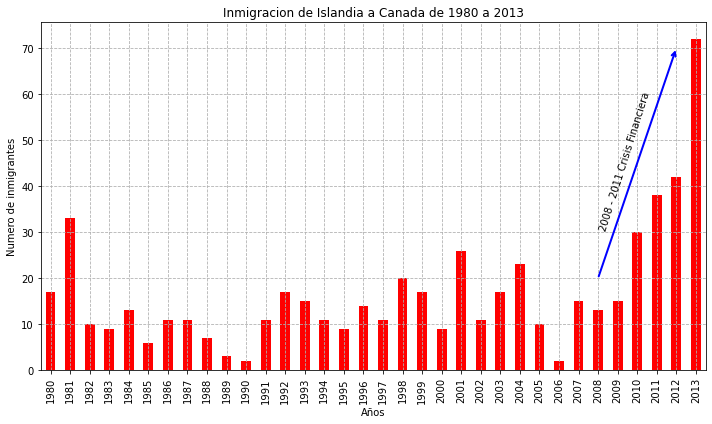

In [ ]:
df_iceland.plot(kind = 'bar',figsize = (10,6),color = 'red')
plt.title('Inmigracion de Islandia a Canada de 1980 a 2013')
plt.xlabel('Años')
plt.ylabel('Numero de inmigrantes')
plt.grid(linestyle = '--')

#FLECHA
plt.annotate(s = '', #DEJAMOS EN BLANCO PUES NO QUEREMOS TEXTO
             xy = (32,70), #INDICA EL PUNTO FINAL DE LA FLECHA
             xytext = (28,20), #INDICA EL PUNTO INICIAL
             xycoords = 'data',
             arrowprops = {'arrowstyle':'->','connectionstyle':'arc3','color':'blue','lw':2})

#TEXTO DE LA FLECHA
plt.annotate('2008 - 2011 Crisis Financiera', # TEXTO A MOSTRAR
             xy=(28, 30),                    # EMPIEZA EL TEXTO (año 2008, pob 30)
             rotation=72.5,                  # SE PONE BASADO EN PRUEBA Y ERROR PARA ACOMODARLO CON LA FLECHA
             va='bottom',                    # VERTICALMENTE 'ABAJO'
             ha='left',                      # HORIZONTALMENTE 'IZQUIERDA'
            )

plt.tight_layout()

### Gráfico de pastel o circular usando pandas

Un gráfico circular es un gráfico estadístico dividido en rodajas para ilustrar la proporción numérica.

Para poder hacer gráficos de pastel tenemos los siguientes pasos.

1. Recolectamos los datos mediante groupby

2. Aplicar plot con kind igual a «pie»
```
DF.plot(kind = 'pie')
```

Es posible añadir ciertos argumentos.

* autopct : String o función usada para etiquetar las partes de la gráfica con su valor numérico. La etiqueta será puesta dentro de cada proporción. Sí es un string con formato, la etiqueta será «fmt%pct».

* startangle : Rota el inicio del pastel en grados en sentido horario a las manecillas del reloj.

* shadow : Dibuja una sombra debajo del pastel.

Existen argumentos extra que ayudan a la estética.

* labels : Habilita o deshabilita las etiquetas del gráfico

* pctdistance : Retira los porcentajes para ponerlos fuera del gráfico

* colors : Lista con los colores deseados a cada elemento del gráfico

* Explode : Lista que indica la distancia de ciertos elementos respecto al gráfico.

***EJEMPLO***

In [ ]:
#SUPONGAMOS QUE QUEREMOS GRAFICAR LA INMIGRACION CONTINENTAL

#PRIMERO AGRUPAMOS POR CONTINENTE USANDO groupby
#SUMAREMOS ADEMAS EL NUMERO DE INMIGRANTES A LOS QUE ESTAN ANEXADOS A DICHO CONTINENTE

df_continent = df_canada.groupby('Continent').sum()

df_continent

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Continent,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Africa,3951,4363,3819,2671,2639,2650,3782,7494,7552,9894,11012,14228,19242,16531,13072,14806,15700,14471,13791,15996,20346,24292,22710,23366,28192,27523,29188,28284,29890,34534,40892,35441,38083,38543,618948
Asia,31025,34314,30214,24696,27274,23850,28739,43203,47454,60256,72829,89964,90752,98737,88852,90424,103030,106383,90929,106844,134544,148083,137653,131769,134850,159253,149054,133459,139894,141434,163845,146894,152218,155075,3317794
Europe,39760,44802,42720,24638,22287,20844,24370,46698,54726,60893,68301,57938,64123,62937,62531,55764,55642,48841,36719,35639,38215,42779,36798,34556,38082,35955,33053,33495,34692,35078,33425,26778,29177,28691,1410947
Latin America and the Caribbean,13081,15215,16769,15427,13678,15171,21179,28471,21924,25060,27942,36827,37853,33840,21341,20262,18645,17174,13830,15088,16898,20067,19317,20263,22181,24747,24676,26011,26547,26867,28818,27856,27173,24950,765148
Northern America,9378,10030,9074,7100,6661,6543,7074,7705,6469,6790,5895,6057,6846,7438,5902,4891,5516,4753,4437,5196,5433,5604,4948,5543,6990,8394,9613,9463,10190,8995,8142,7677,7892,8503,241142
Oceania,1942,1839,1675,1018,878,920,904,1200,1181,1539,2075,2495,2871,2566,1967,1565,1552,1263,1021,1055,1276,1818,1685,1800,1788,1585,1473,1693,1834,1860,1834,1548,1679,1775,55174


Text(0.5, 1.0, 'Inmigracion a Canada por continente de 1980 a 2013')

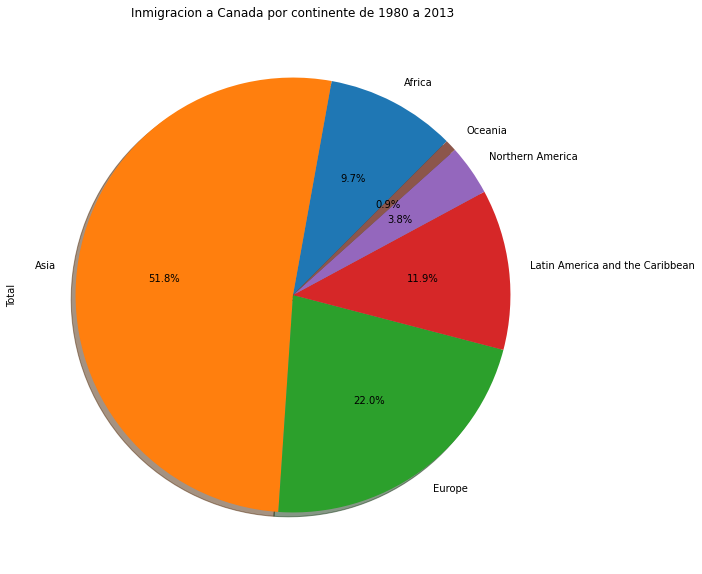

In [ ]:
#GRACIAS A LA COLUMNA TOTAL PODEMOS TRABAJAR DE MANERA COMODA CON LA 
#GRAFICA DE PASTEL

df_continent.loc[:,'Total'].plot(kind = 'pie',
                                 figsize = (10,10),
                                 autopct = '%1.1f%%',
                                 startangle = 45,
                                 shadow = True)
plt.title('Inmigracion a Canada por continente de 1980 a 2013')

El gráfico anterior no es muy estético. Añadimos los parámetros extra.

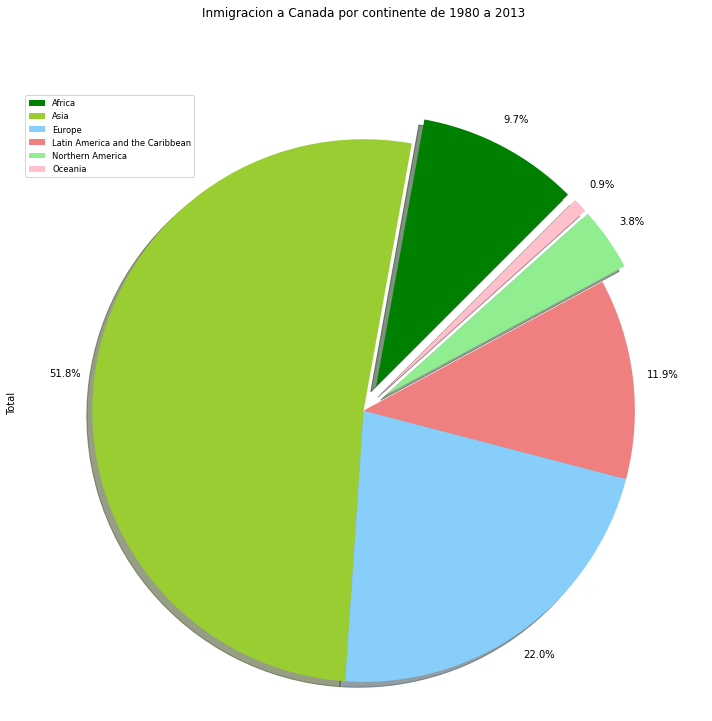

In [ ]:
df_continent.loc[:,'Total'].plot(kind = 'pie',
                                 figsize = (10,10),
                                 autopct = '%1.1f%%',
                                 startangle = 45,
                                 shadow = True,
                                 labels = None, #DESHABILITAMOS LAS ETIQUETAS
                                 pctdistance = 1.11, #LA DISTANCIA DE LOS PORCENTAJES A SU PEDAZO
                                 colors = ['green','yellowgreen','lightskyblue','lightcoral','lightgreen','pink'],
                                 explode = [0.1,0,0,0,0.1,0.1]) #AQUI VAMOS DANDO VALORES VIENDO CUAL NOS GUSTA MAS A DISTANCIAR
plt.title('Inmigracion a Canada por continente de 1980 a 2013', y = 1.11) #ES RECOMENDABLE QUE LA DISTANCIA DEL TITULO SEA IGUAL QUE LOS PORCENTAJES

plt.axis('equal')

#AÑADIMOS ETIQUETA

plt.legend(labels = df_continent.index, loc = 'upper left')

plt.tight_layout()

***EJEMPLO***

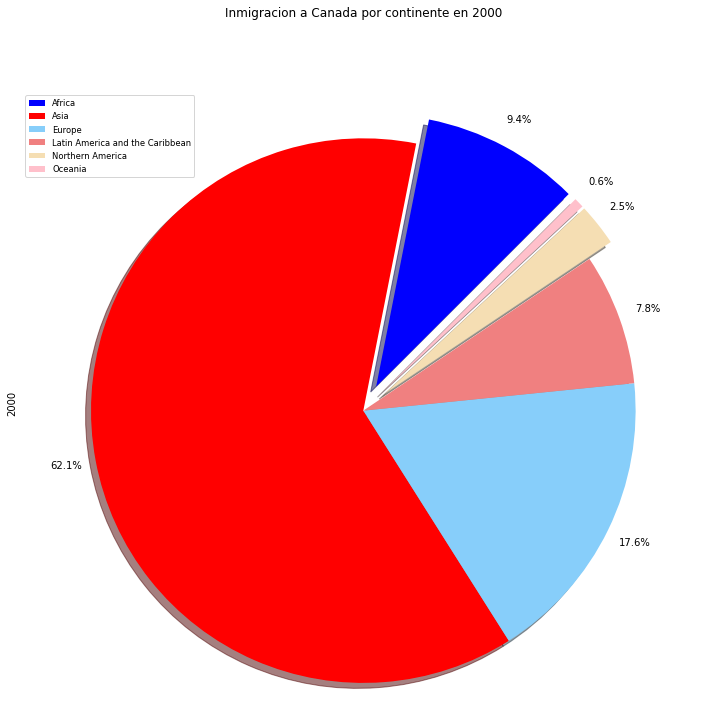

In [ ]:
#SUPONGAMOS QUE QUEREMOS HACER UNA GRAFICA DE PASTEL DE LA INMIGRACION DEL 2000

df_continent.loc[:,2000].plot(kind = 'pie',
                                 figsize = (10,10),
                                 autopct = '%1.1f%%',
                                 startangle = 45,
                                 shadow = True,
                                 labels = None, #DESHABILITAMOS LAS ETIQUETAS
                                 pctdistance = 1.11, #LA DISTANCIA DE LOS PORCENTAJES A SU PEDAZO
                                 colors = ['blue','red','lightskyblue','lightcoral','wheat','pink'],
                                 explode = [0.1,0,0,0,0.1,0.1]) #AQUI VAMOS DANDO VALORES VIENDO CUAL NOS GUSTA MAS A DISTANCIAR
plt.title('Inmigracion a Canada por continente en 2000', y = 1.11) #ES RECOMENDABLE QUE LA DISTANCIA DEL TITULO SEA IGUAL QUE LOS PORCENTAJES

plt.axis('equal')

#AÑADIMOS ETIQUETA

plt.legend(labels = df_continent.index, loc = 'upper left')

plt.tight_layout()

### Diagramas de cajas (box plot) usando pandas

Un diagrama de caja es una forma de representar estadísticamente la distribución de datos a través de cinco dimensiones principales.

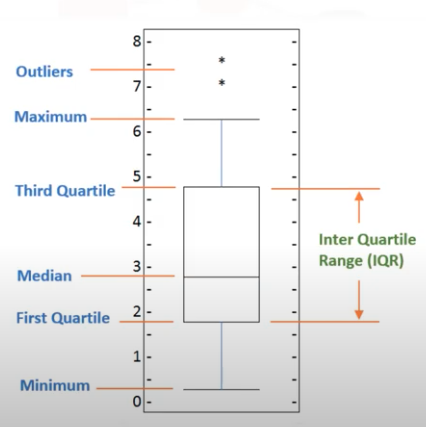

1. La primera dimensión : Mínimo.

El mínimo indica el número más pequeño de todos los datos.

2. La segunda dimensión : Primer cuarto.

El primer cuarto indica donde se encuentra el $25 \%$ de los datos.

3. La tercer dimensión : Mediana.

Es la mediana de los datos ordenados.

4. La cuarta dimensión : Tercer cuarto.

El tercer cuarto indica donde se encuentra el $75\%$ de los datos.

5. La quinta dimensión : Máximo.

El máximo indica el número más grande de todos los datos.

Sintaxis.

```
DF.plot(kind = 'box')
```

Es posible realizar gráfica de cajas horizontales.

Sintaxis.

```
DF.plot(kind = 'box',vert = False)
```


***EJEMPLO***

In [ ]:
#SUPONGA QUE QUEREMOS VISUALIZAR MEDIANTE CAJAS LA INMIGRACION DE JAPON A CANADA
df_japan = df_canada.loc['Japan',list(Year for Year in range (1980,2014))]

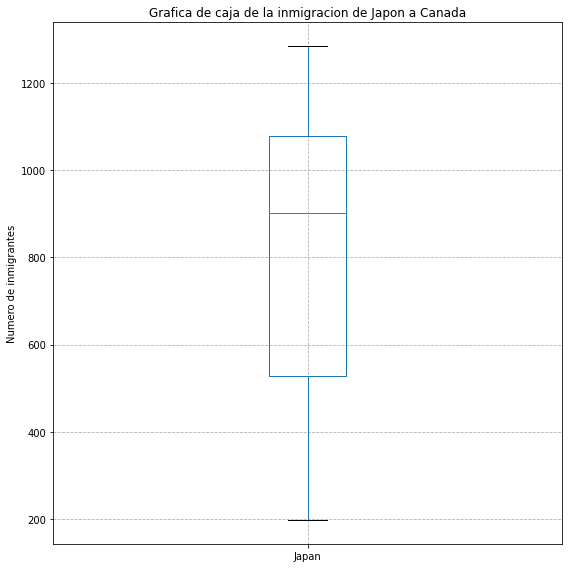

In [ ]:
df_japan.plot(kind = 'box',figsize = (8,8))
plt.title('Grafica de caja de la inmigracion de Japon a Canada')
plt.ylabel('Numero de inmigrantes')
plt.grid(linestyle='--')
plt.tight_layout()

***EJEMPLO***

In [ ]:
#VAMOS A COMPARAR MEDIANTE GRAFICO DE CAJAS LA DISTRIBUCION DE INMIGRANTES
#DE INDIA Y CHINA DE 1980 A 2013

df_in_chi = df_canada.loc[['India','China'],list(Year for Year in range (1980,2014))]
df_in_chi

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
India,8880,8670,8147,7338,5704,4211,7150,10189,11522,10343,12041,13734,13673,21496,18620,18489,23859,22268,17241,18974,28572,31223,31889,27155,28235,36210,33848,28742,28261,29456,34235,27509,30933,33087
China,5123,6682,3308,1863,1527,1816,1960,2643,2758,4323,8076,14255,10846,9817,13128,14398,19415,20475,21049,30069,35529,36434,31961,36439,36619,42584,33518,27642,30037,29622,30391,28502,33024,34129


In [ ]:
#NECESITAMOS QUE LOS INDICES NO SEAN LOS PAISES
df_in_chi = df_in_chi.transpose()
df_in_chi.head()

,India,China
1980,8880,5123
1981,8670,6682
1982,8147,3308
1983,7338,1863
1984,5704,1527


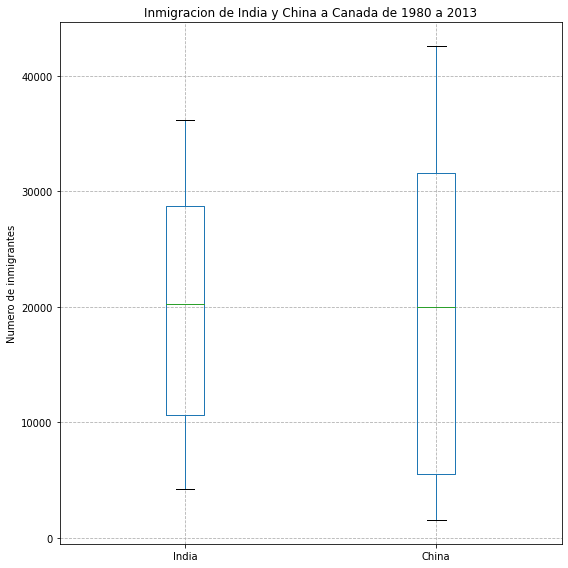

In [ ]:
#GRAFICAMOS
df_in_chi.plot(kind = 'box',figsize = (8,8))
plt.title('Inmigracion de India y China a Canada de 1980 a 2013')
plt.ylabel('Numero de inmigrantes')
plt.grid(linestyle = '--')
plt.tight_layout()

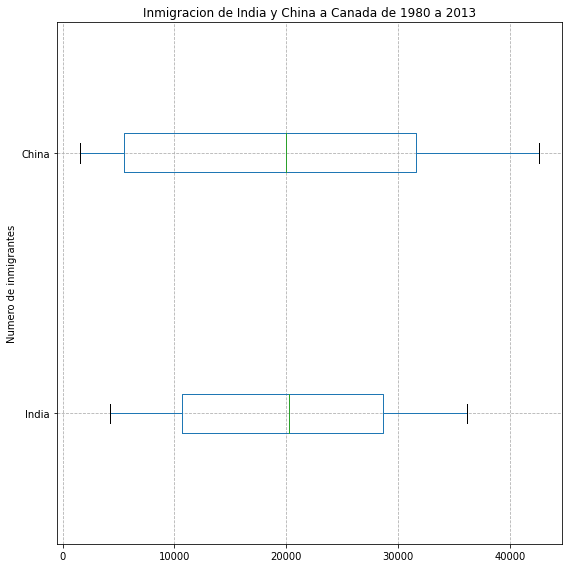

In [ ]:
#REPRESENTACION HORIZONTAL
df_in_chi.plot(kind = 'box',figsize = (8,8),vert = False)
plt.title('Inmigracion de India y China a Canada de 1980 a 2013')
plt.ylabel('Numero de inmigrantes')
plt.grid(linestyle = '--')
plt.tight_layout()

***EJEMPLO***

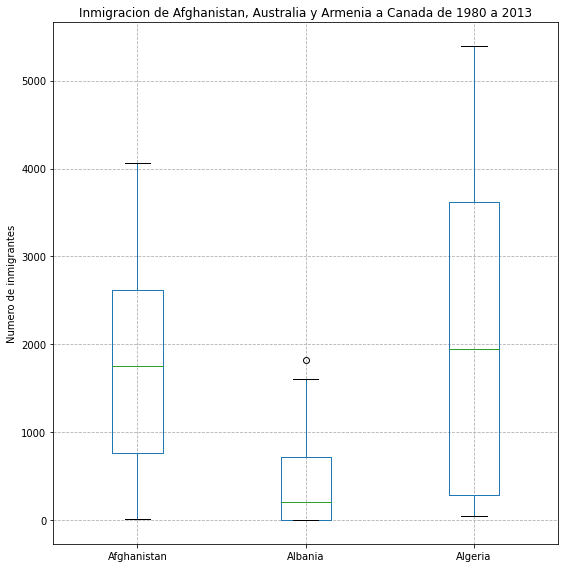

In [ ]:
# GRAFICAMOS DE Afghanistan, Albania Y Algeria
df_canada.loc[['Afghanistan','Albania','Algeria'],list(Year for Year in range (1980,2014))].transpose().plot(kind = 'box',figsize = (8,8))
plt.title('Inmigracion de Afghanistan, Australia y Armenia a Canada de 1980 a 2013')
plt.ylabel('Numero de inmigrantes')
plt.grid(linestyle = '--')
plt.tight_layout()

### Diagrama de dispersión usando pandas

Un diagrama de dispersión es un tipo de diagrama que muestra valores pertenecientes típicamente a dos variables una contra la otra.

Usualmente es una variable dependiente a ser trazada contra una variable independiente para determinar si existe alguna correlación entre las dos.

Sintaxis.

```
DF.plot(kind = 'scatter', x = 'Columna_i', y = 'Columna_j')
```


***EJEMPLO***

In [ ]:
#SUPONGA QUE QUEREMOS TRAZAR UN DIAGRAMA DE DISPERSION DE LA INMIGRACION
#ANUAL TOTAL PARA CANADA

#PARA ESTO NECESITAMOS UN DF DONDE UNA COLUMNA SEAN LOS AÑOS Y OTRA EL TOTAL

df_total = pd.DataFrame({'Year':list(Year for Year in range(1980,2014)), 'Total':list( df_canada.loc[:,j].sum() for j in range(1980,2014))})
df_total.head()

,Year,Total
0,1980,99137
1,1981,110563
2,1982,104271
3,1983,75550
4,1984,73417


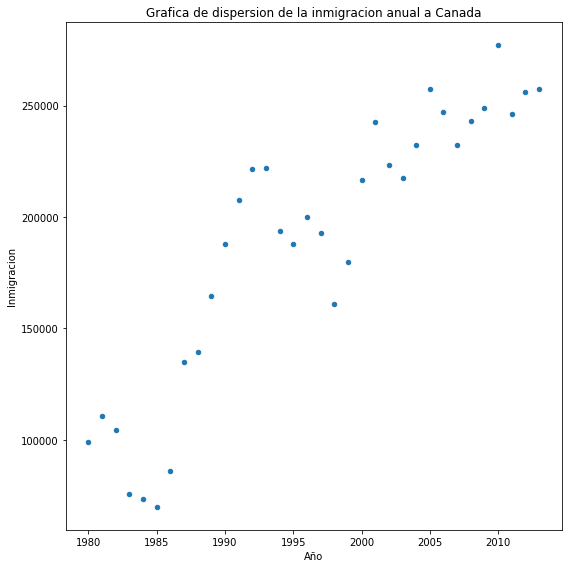

In [ ]:
#GRAFICAMOS
df_total.plot(kind = 'scatter', x = 'Year', y = 'Total', figsize = (8,8))
plt.title('Grafica de dispersion de la inmigracion anual a Canada')
plt.xlabel('Año')
plt.ylabel('Inmigracion')
plt.tight_layout()

Podemos estudiar matemáticamente esta tendencia positiva visible en la gráfica.

In [ ]:
#COEFICIENTE DE DETERMINACION (R^2)

from sklearn.linear_model import LinearRegression

LR = LinearRegression()

LR.fit(df_total[['Year']], df_total[['Total']])

print('El coeficiente de determinacion es ',LR.score(df_total[['Year']], df_total[['Total']]))

El coeficiente de determinacion es  0.8044281199537422


In [ ]:
#AJUSTAMOS LA RECTA DE REGRESION

f = np.polyfit(df_total.loc[:,'Year'], df_total.loc[:,'Total'], 1)
p = np.poly1d(f)
print(p)

 
5567 x - 1.093e+07


Por lo tanto la recta de regresión es

$$\hat{y} = -(10926195.24537)+5567.09228\cdot x$$

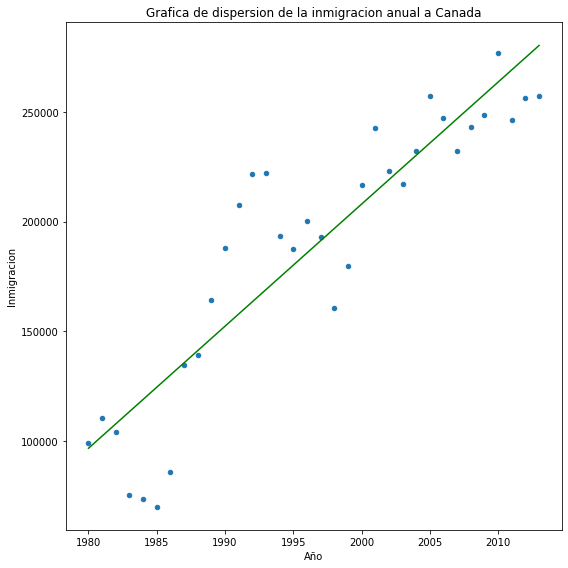

In [ ]:
#GRAFICAMOS LA RECTA DE REGRESION JUNTO AL GRAFICO DE DISPERSION
df_total.plot(kind = 'scatter', x = 'Year', y = 'Total', figsize = (8,8)) #G. DISPERSION
plt.plot(df_total.loc[:,'Year'], p[0] + p[1]*df_total.loc[:,'Year'],color = 'green') #RECTA REGRESION
plt.title('Grafica de dispersion de la inmigracion anual a Canada')
plt.xlabel('Año')
plt.ylabel('Inmigracion')
plt.tight_layout()

### Gráficas de burbuja usando pandas

Una gráfica de burbuja es una variante de la gráfica de dispersión que muestra los datos en tre dimensiones $(x,y,z)$.

Los datos son reemplazados por burbujas y el tamaño de cada una es determinado por la variable $z$, conocida como peso.

En Matplotlib podemos pasar un arreglo o escalar mediante el argumento «s» de la gráfica «scatter».

***EJEMPLO***

Argentina padeció una severa depresión entre 1998 y 2002 que causó un desempleo generalizado, disturbios, la caida del gobierno y la suspensión de pagos de su deuda externa. En término de ingresos, mas del 50% de los argentinos empobrecierón y siete de cada diez niños eran pobres en los mas profundo de la crisis en 2002.

Analicemos el efecto de la crisis y vamos a comparar la inmigración de argentinos hacia su país vecino Brasil. 

Estableceremos los pesos para las burbujas como **el valor normalizado para cada año**.

In [ ]:
#ACOMODAMOS LA INFORMACION

df_canada_t = df_canada[list(Year for Year in range(1980,2014))].transpose()
df_canada_t.reset_index(inplace=True) #REINICIAMOS LOS INDICES Y CONVERTIMOS A COLUMNA LOS AÑOS
df_canada_t.rename(columns={'index':'Year'},inplace = True)
df_canada_t.head()

,Year,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Burundi,Cabo Verde,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,"China, Hong Kong Special Administrative Region","China, Macao Special Administrative Region",...,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,South Africa,Spain,Sri Lanka,State of Palestine,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syrian Arab Republic,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Togo,Tonga,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Tuvalu,Uganda,Ukraine,United Arab Emirates,United Kingdom of Great Britain and Northern Ireland,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Sahara,Yemen,Zambia,Zimbabwe
0,1980,16,1,80,0,0,1,0,368,0,702,234,0,26,0,83,372,0,511,16,2,0,44,0,10,211,79,24,2,0,1,12,9,0,4,0,1233,5123,0,0,...,6,241,0,0,7,1026,211,185,0,20,15,4,281,806,315,0,56,0,5,2,958,58,481,0,0,13,0,0,22045,635,9378,128,0,0,103,1191,0,1,11,72
1,1981,39,0,67,1,0,3,0,426,0,639,238,0,23,2,84,376,0,540,27,5,0,52,0,1,220,6,20,1,0,1,19,2,0,3,0,1069,6682,0,0,...,6,301,0,0,10,1118,299,371,0,12,10,1,308,811,419,0,53,0,5,4,947,51,874,0,1,16,0,2,24796,832,10030,132,0,0,117,1829,0,2,17,114
2,1982,39,0,71,0,0,6,0,626,0,484,201,0,38,1,86,299,0,519,13,4,0,42,0,3,192,8,12,3,0,2,26,16,0,1,1,1078,3308,0,0,...,7,337,0,0,7,781,260,290,0,11,21,1,222,634,409,0,113,0,2,7,972,55,706,0,0,17,0,2,20620,621,9074,146,0,0,174,2162,0,1,11,102
3,1983,47,0,69,0,0,6,0,241,0,317,117,0,12,1,81,244,0,297,21,3,0,49,0,3,139,2,33,2,0,0,33,7,0,0,0,781,1863,0,0,...,3,169,0,0,12,379,133,197,0,7,12,0,176,370,269,0,65,0,3,1,766,46,280,0,0,38,0,1,10015,474,7100,105,0,0,124,3404,0,6,7,44
4,1984,71,0,63,0,0,4,42,237,0,317,127,0,21,1,98,265,0,183,37,4,1,38,0,7,145,2,11,3,1,11,10,8,0,0,0,681,1527,0,0,...,12,128,0,0,14,271,137,1086,0,23,5,10,128,326,264,0,82,0,6,2,606,51,338,0,1,32,0,2,10170,473,6661,90,0,0,142,7583,0,0,16,32


Hacemos la normalización mediante la siguiente ecuación.

$$X_{new} = \frac{X_{old}-X_{min}}{X_{max}-X_{min}}$$

In [ ]:
#NORMALIZAMOS LA COLUMNA DE Argentina Y Brazil
norm_brazil = (df_canada_t['Brazil'] - df_canada_t['Brazil'].min())/(df_canada_t['Brazil'].max() - df_canada_t['Brazil'].min())
norm_argentina = (df_canada_t['Argentina'] - df_canada_t['Argentina'].min())/(df_canada_t['Argentina'].max() - df_canada_t['Argentina'].min())

Como los pesos son normalizados, es decir que son valores entre 0 y 1, estos no son visibles a la gráfica. Por tanto:

1. Multiplicamos los pesos por 2000 para escalarlos

2. Sumamos 10 para compensar el valor mínimo (el valor mínimo es 0 pues son normalizados)

<Figure size 432x288 with 0 Axes>

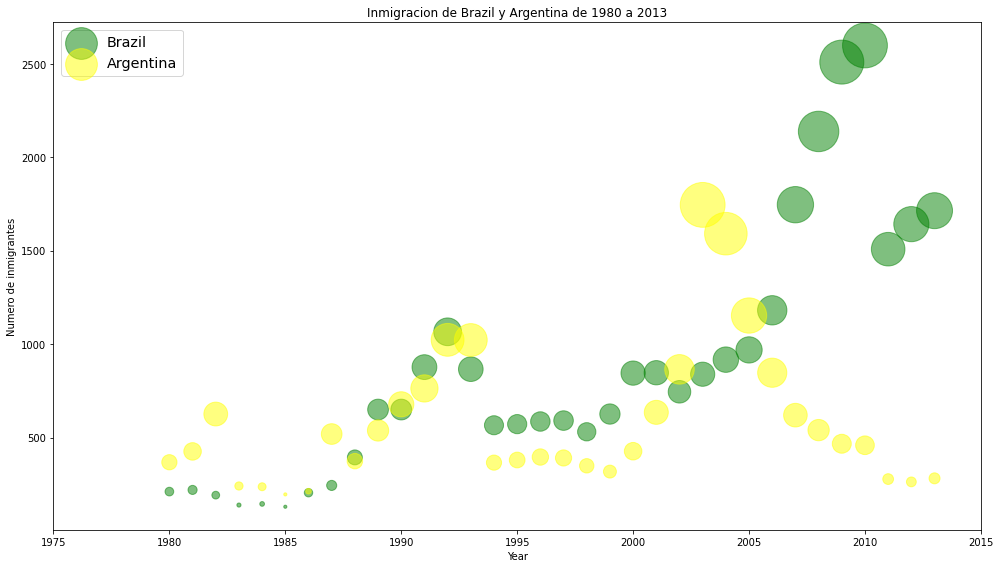

In [ ]:
#GRAFICAMOS LOS DOS GRAFICOS JUNTOS

fig = plt.figure()

ax0 = df_canada_t.plot(kind = 'scatter',
                                 x = 'Year',
                                 y = 'Brazil',
                                 figsize = (14,8),
                                 alpha = 0.5,
                                 color = 'green',
                                 s = norm_brazil*2000 + 10, #PESO
                                 xlim = (1975,2015))
ax1 = df_canada_t.plot(kind = 'scatter',
                 x = 'Year',
                 y = 'Argentina',
                 alpha = 0.5,
                 color = 'yellow',
                 s = norm_argentina*2000 + 10, #PESO
                 ax = ax0) #INDICAMOS QUE SE IMPRIMAN JUNTAS

ax0.set_ylabel('Numero de inmigrantes')
ax0.set_title('Inmigracion de Brazil y Argentina de 1980 a 2013')
ax0.legend(['Brazil','Argentina'], loc = 'upper left', fontsize = 'x-large')
plt.tight_layout()

El tamaño de las burbujas corresponde a la magnitud de la población inmigrante para ese año, comparado con los datos de 1980 - 2013. Cuanto mas grande es la burbuja mas inmigrantes corresponden a ese año.

En la gráfica de arriba podemos ver un incremento de la inmigración desde Argentina durante los años de la depresión de 1998 a 2002. También observamos un repunte similar entre 1985 y 1993. De hecho, Argentina sufrió una depresión de 1974 a 1990, justo antes de la de 1998 a 2002.

En una observación similar, Brasil sufrió el Efecto Samba en el cual su moneda el Real se devaluó cerca del 35% en 1999. Hubo temor sobre una crisis financiera sudamericana debido a que aquellos paises tenian una fuerte dependencia de las exportaciones industriales desde Brasil. El gobierno brasileño adoptó un programa de austeridad y su economía poco a poco se recuperó cada año, finalizando con un descenso en 2010. Los datos de inmigración reflejan estos eventos.


### Otros gráficos mediante la librería pandas

Como nos podemos dar cuenta, la palabra clave 'kind' nos da acceso a distintas gráficas haciendo uso de la librería pandas. A continuación damos un listado de aquellos diagramos disponibles mediante este método.

|kind|Descripción|
|--|--|
|density|Diagramas de densidad|
|hexbin|Diagramas con agrupamiento hexagonal|

## Gráfico de Waffle

Un waffle chart es una buena forma de visualizar datos en relación con un todo o para resaltar el progreso en contra de un umbral dado.

Una visualización interactiva sobre lo que sucede detrás es la siguiente.

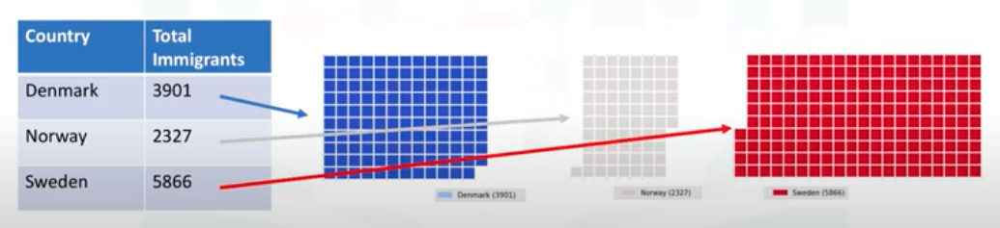

Matplotlib no tiene una función integrada para crear gráficos de waffle, a excepción de una nueva paquetería aun en construcción. 

Se aloja en el siguiente link la información extra.

[PyWaffle][1]

[1]: https://github.com/gyli/PyWaffle

Se propone la siguiente función. (Dada en el curso Visualización de Datos con Python de IBM).

Esta función tomara los siguientes parámetros de entrada:
> 1. **D**: Data Frame que contiene el nombre de las categorias
> 1.  **categories**: Categoria unicas o clases en el dataframe
> 2.  **values**: Valores correspondientes a las categorias o clases 
> 3.  **height**: Define la altura de la gráfica 
> 4.  **width**: Define el ancho de la gráfica 
> 5.  **colormap**: Clase Colormap
> 6.  **value_sign**: Para poder hacer que nuestra función sea mas general, añadiremos este parámetro para tener en cuenta signos que pudieran estas asociados a algún valor, como puede ser %, $, etc. **value_sign** tiene un valor por defecto de cadena vacia.

In [ ]:
def create_waffle_chart(D,categories, values, height, width, colormap, value_sign=''):
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    # calcular la proporción de cada categoria respecto al total 
    total_values = sum(values)
    category_proportions = [(float(value) / total_values) for value in values]

    # calcular el numero total de partes 
    total_num_tiles = width * height # total number of tiles
    print ('Total number of tiles is', total_num_tiles)
    
    # calcular el numero de partes por categoria 
    tiles_per_category = [round(proportion * total_num_tiles) for proportion in category_proportions]

    # imprimir el numero de partes por categoria 
    for i, tiles in enumerate(tiles_per_category):
        print (D.index.values[i] + ': ' + str(tiles)) #######

    # inicializar la gráfica como una matriz vacia 
    waffle_chart = np.zeros((height, width))

    # definir los indices que interactuaran con la gráfica 
    category_index = 0
    tile_index = 0

    # rellenar la gráfica 
    for col in range(width):
        for row in range(height):
            tile_index += 1

            # si el numero de partes rellenada para la categoria actual 
            # es igual al numero de partes colocada
            if tile_index > sum(tiles_per_category[0:category_index]):
                # ...proceder a la siguiente categoria 
                category_index += 1       
            
            # establece el valor de la clase a entero, el cual incremente con clase
            waffle_chart[row, col] = category_index
    
    # instanciar un nuevo objeto "figure"
    fig = plt.figure()

    # usar matshow para mostrar la gráfica
    plt.matshow(waffle_chart, cmap=colormap)
    plt.colorbar()

    # obtener el eje 
    ax = plt.gca()

    # establecer anchos 
    ax.set_xticks(np.arange(-.5, (width), 1), minor=True)
    ax.set_yticks(np.arange(-.5, (height), 1), minor=True)
    
    # añadir una cuadricula basada en el ancho 
    ax.grid(which='minor', color='w', linestyle='-', linewidth=2)

    plt.xticks([])
    plt.yticks([])

    # Calcular la suma acumulada de las categorías individuales para hacer concordar el esquema de color entre la grafica y la leyenda
    values_cumsum = np.cumsum(values)
    total_values = values_cumsum[len(values_cumsum) - 1]

    # crear una leyenda 
    legend_handles = []
    for i, category in enumerate(categories):
        if value_sign == '%':
            label_str = category + ' (' + str(values[i]) + value_sign + ')'
        else:
            label_str = category + ' (' + value_sign + str(values[i]) + ')'
            
        color_val = colormap(float(values_cumsum[i])/total_values)
        legend_handles.append(mpatches.Patch(color=color_val, label=label_str))

    # añadir una leyenda a la gráfica
    plt.legend(
        handles=legend_handles,
        loc='lower center', 
        ncol=len(categories),
        bbox_to_anchor=(0., -0.2, 0.95, .1)
    )

***EJEMPLO***

In [ ]:
#VAMOS ANALIZAR MEDIANTE UN GRAFICO DE WAFFLE LA INMIGRACION DE DINAMARCA, NORUEGA Y SUIZA

df_dsn = df_canada.loc[['Denmark', 'Norway', 'Sweden'], :]
df_dsn

,Continent,Region,DevName,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Denmark,Europe,Northern Europe,Developed regions,272,293,299,106,93,73,93,109,129,129,118,111,158,186,93,111,70,83,63,81,93,81,70,89,89,62,101,97,108,81,92,93,94,81,3901
Norway,Europe,Northern Europe,Developed regions,116,77,106,51,31,54,56,80,73,76,83,103,74,92,60,65,70,104,31,36,56,78,74,77,73,57,53,73,66,75,46,49,53,59,2327
Sweden,Europe,Northern Europe,Developed regions,281,308,222,176,128,158,187,198,171,182,130,167,179,203,192,176,161,151,123,170,138,184,149,161,129,205,139,193,165,167,159,134,140,140,5866


In [ ]:
#VAMOS A DESIGNAR EL SIGUIENTE ANCHO Y ALTO DEL GRAFICO

width = 40 # ancho de la gráfica
height = 10 # altura de la gráfica

In [ ]:
#LAS CATEGORIAS NECESARIAS LAS DESIGNAREMOS ASI PUES QUEREMOS QUE SEAN LOS NOMBRES DE LOS PAISES A ANALIZAR

categories = df_dsn.index.values # categorias 
categories

array(['Denmark', 'Norway', 'Sweden'], dtype=object)

In [ ]:
#GRAFICAREMOS DENTRO DEL GRAFICO LOS VALORES DE LA COLUMNA Total

values = df_dsn['Total'] # valores correspondientes de las categorias 

In [ ]:
#ASIGNAMOS UNA CIERTA PALETA DE COLORES, ESTA PUEDE SER MODIFICADA A GUSTO

colormap = plt.cm.gist_rainbow_r # clase de color del mapa 

Total number of tiles is 400
Denmark: 129
Norway: 77
Sweden: 194


<Figure size 432x288 with 0 Axes>

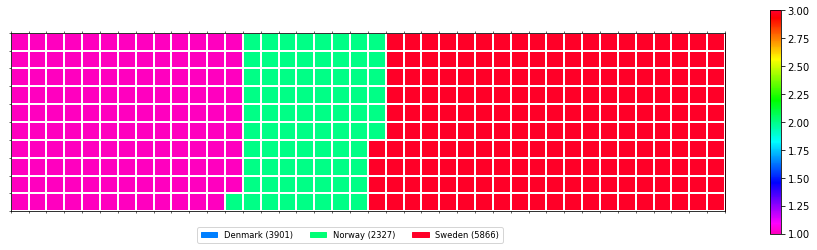

In [ ]:
#IMPRIMIMOS EL GRAFICO DE WAFFLE

create_waffle_chart(D = df_dsn,categories = categories, values = values, height = height, width = width, colormap = colormap)

***EJEMPLO***

Total number of tiles is 400
India: 223
United Kingdom of Great Britain and Northern Ireland: 177


<Figure size 432x288 with 0 Axes>

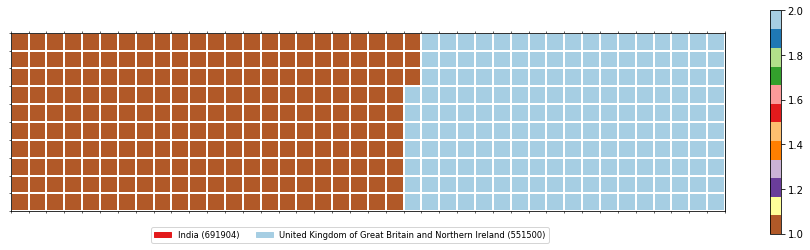

In [ ]:
#ANALIZAMOS AHORA LA TENDENCIA DE INMIGRACION DE INDIA Y UK

df_icf = df_canada.loc[['India','United Kingdom of Great Britain and Northern Ireland'],:]
create_waffle_chart(D = df_icf,categories = df_icf.index.values, values = df_icf['Total'], height = 10, width = 40, colormap = plt.cm.Paired_r)

Total number of tiles is 400
Viet Nam: 344
Albania: 56


<Figure size 432x288 with 0 Axes>

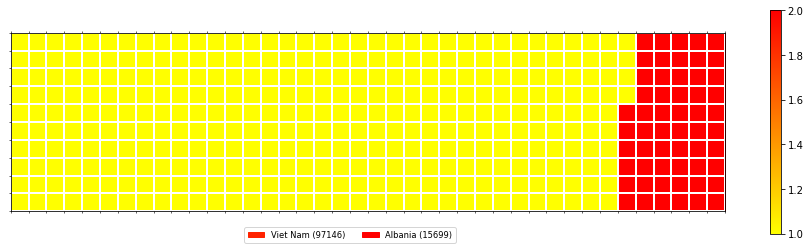

In [ ]:
#ANALIZAMOS AHORA LA TENDENCIA DE Viet Nam Y Albania
df_i = df_canada.loc[['Viet Nam','Albania'],:]
create_waffle_chart(D = df_i,categories = df_i.index.values, values = df_i['Total'], height = 10, width = 40, colormap = plt.cm.autumn_r)

## Gráfico de nube de palabras (word cloud)

Un gráfico de nube de palabras es simplemente una representación de la importancia de las diferentes palabras en el cuerpo del texto.

Un word cloud funciona de una manera simple; cuanto más aparece una palabra específica en una fuente de datos textuales, más grande y audaz aparece en el word cloud.

Una visualización interactiva sobre lo que sucede detrás es la siguiente.

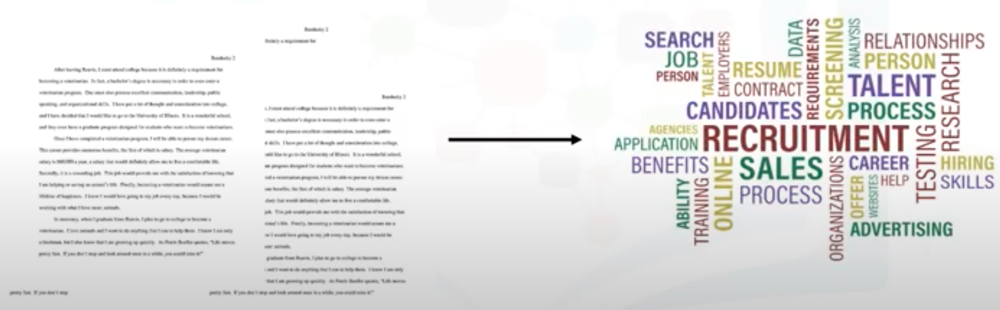

Al igual que las gráficas de Waffle, la librería Matplotlib no tiene una función integradas para crear gráficos de nube de palabras.

Sin embargo Andreas Mueller diseñó un módulo de Python para la generación de word cloud de manera pública.

In [ ]:
#IMPORTAMOS LA PAQUETERIA
from wordcloud import WordCloud, STOPWORDS

Para usos de este tema, usaremos el libro 'Alicia en el País de las Maravillas' de **Lewis Carrol**.

In [ ]:
#DESCARGAMOS EL .txt DE LA NOVELA
!wget --quiet https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DV0101EN/labs/Data_Files/alice_novel.txt

# abrir el archivo y guardarlo en la variable alice_novel 
alice_novel = open('alice_novel.txt', 'r').read()

In [ ]:
#USAMOS LA FUNCION set PARA ELIMINAR PALABRAS REDUNDANTES
stopwords = set(STOPWORDS)

In [ ]:
# CREAMOS UNA NUBE DE SOLO 2000 PALABRAS CON FONDO BLANCO
alice_wc = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

# GENERAMOS LA NUBE
alice_wc.generate(alice_novel)

(-0.5, 399.5, 199.5, -0.5)

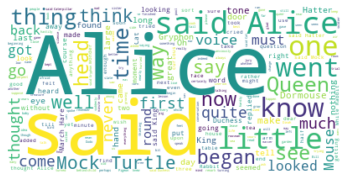

In [ ]:
#VISUALIZAMOS LA NUBE
plt.imshow(alice_wc, interpolation='bilinear')
plt.axis('off')

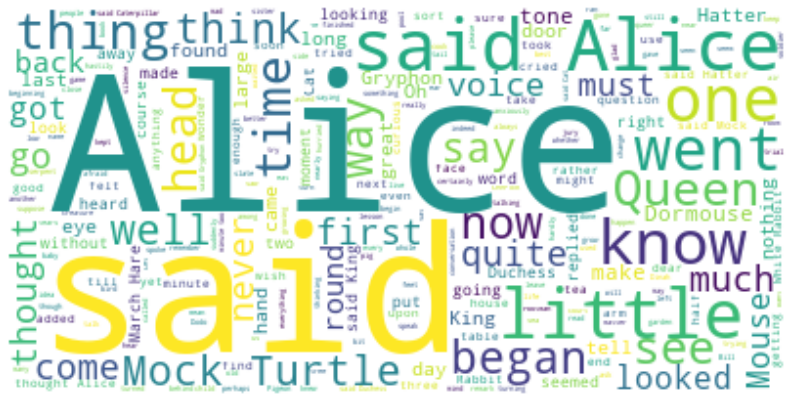

In [ ]:
#ESTABLECEMOS EL ANCHO Y ALTO CON EL SIGUIENTE CODIGO
fig = plt.figure()
fig.set_figwidth(14) # establecer ancho
fig.set_figheight(18) # establecer altura

plt.imshow(alice_wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
#ELIMINAREMOS LA PALABRA said
stopwords.add('said')

(-0.5, 399.5, 199.5, -0.5)

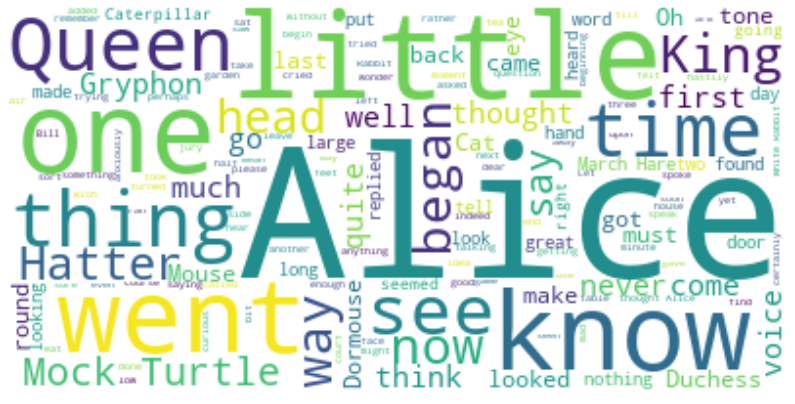

In [ ]:
#GENERAMOS OTRA VEZ LA NUBE
alice_wc.generate(alice_novel)
#GRAFICAMOS
fig = plt.figure()
fig.set_figwidth(14) # establecer ancho 
fig.set_figheight(18) # establecer altura 
plt.imshow(alice_wc, interpolation='bilinear')
plt.axis('off')

Notemos que por defecto esta nube de palabras se forman en un cuadrado pero es viable ponerlas en cualquier imagen.

Usaremos la siguiente imagen para suporponer todas las palabras.

In [ ]:
# DESCARGAMOS LA IMAGEN
!wget --quiet https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DV0101EN/labs/Images/alice_mask.png
    
# GUARDAMOS LA IMAGEN EN alice_mask
from PIL import Image #CONVIERTE IMAGENES EN ARREGLOS

alice_mask = np.array(Image.open('alice_mask.png'))

(-0.5, 899.5, 899.5, -0.5)

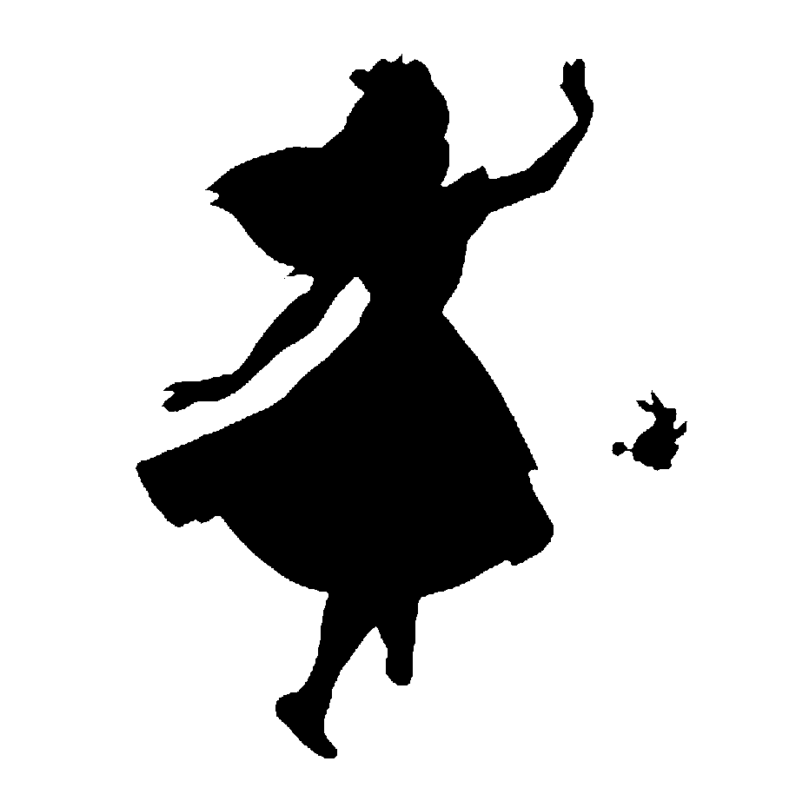

In [ ]:
#VEAMOS COMO QUEDA LA IMAGEN
fig = plt.figure()
fig.set_figwidth(14) # establecer ancho 
fig.set_figheight(18) # establecer altura

plt.imshow(alice_mask, cmap=plt.cm.gray, interpolation='bilinear')
plt.axis('off')

(-0.5, 899.5, 899.5, -0.5)

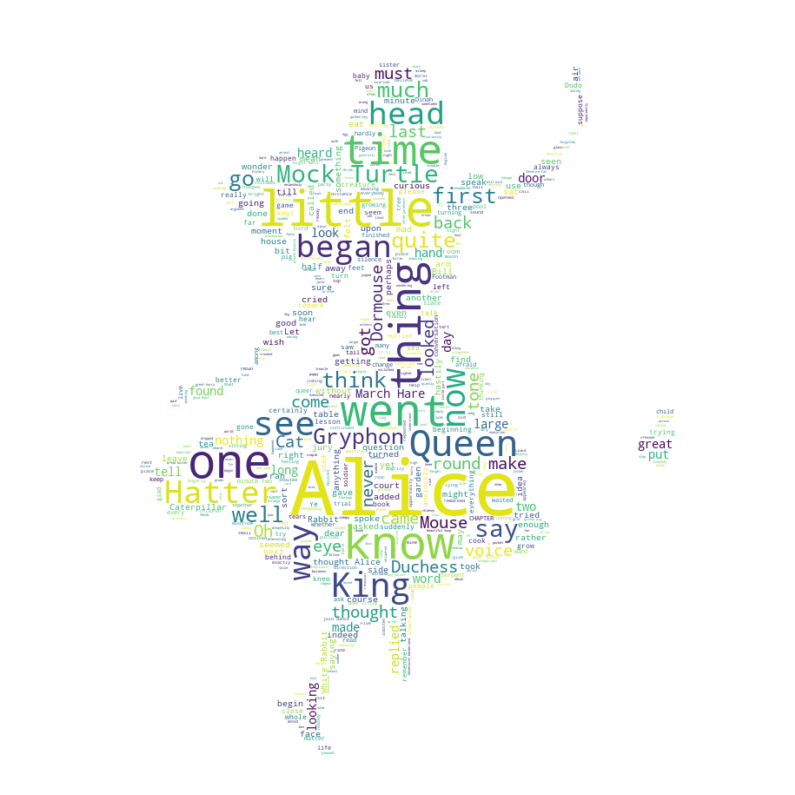

In [ ]:
# CREAMOS LA NUBE
alice_wc = WordCloud(background_color='white', max_words=2000, mask=alice_mask, stopwords=stopwords)

# GENERAMOS LA NUBE
alice_wc.generate(alice_novel)

# MOSTRAMOS LA NUBE
fig = plt.figure()
fig.set_figwidth(14) # establecer el ancho 
fig.set_figheight(18) # establecer la altura 

plt.imshow(alice_wc, interpolation='bilinear')
plt.axis('off')

## Gráfico de funciones partidas

Para realizar el gráfico de funciones usamos la función «piecewise» de NumPy.

Sintaxis.

```
np.piecewise(x, logls, funls)
```

Donde $x$ es un arreglo que define la variable independiente, $logls$ una lista de condiciones lógicas para seccionar y definir los subintervalos, y $funls$ una lista de funciones o constantes que definen el valor de la función para el subintervalo correspondiente.

***EJEMPLO***

Grafique la siguiente función.

$$f(t)= \left\{ \begin{array}{lcc}
             5+5t &   si  & 0\leq t\leq3 \\
             \\ 20 &  si & 3< t\leq 5 \\
             \\ 20-2(t-5) &  si  & 5 < t \leq 9
             \end{array}
   \right.$$

In [1]:
#IMPORTAMOS NumPy
import numpy as np

In [2]:
#NOTEMOS QUE EL DOMINIO ES DE 0 A 9
t = np.linspace(0, 9)

In [3]:
#RECORDEMOS QUE EL PRIMER ARGUMENTO CONTIENE LOS VALORES DE LA VARIABLE INDEPENDIENTE
#EL SEGUNDO ARGUMENTO ES UNA LISTA CON LAS CONDICIONES DE CADA FUNCION f_i
#EL TERCER ARGUMENTO ES UNA LISTA CON FUNCIONES Lambda QUE REPRESENTEN CADA f_i
y = np.piecewise(t, #DOMINIO
                 [np.array((0<=t) & (t<=3)), #CONDICION FUNCION 1
                  np.array((3<t) & (t<=5)), #CONDICION FUNCION 2
                  np.array((5<t) & (t<=9))], #CONDICION FUNCION 3
                 [lambda t: 5+5*t, #FUNCION 1
                  lambda t: 20, #FUNCION 2
                  lambda t: 20 - 2*(t-5)]) #FUNCION 3

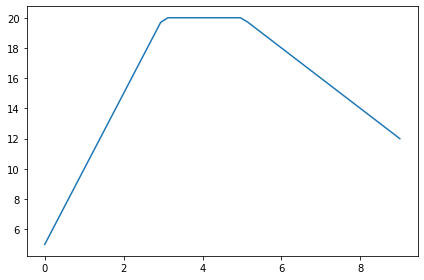

In [5]:
#GRAFICAMOS
plt.plot(t,y)
plt.tight_layout()

***EJEMPLO***

Grafique la siguiente función

$$f(x)= \left\{ \begin{array}{lcc}
             -2x-1 &   si  & x\leq -1 \\
             \\ -x &  si & -1\leq x \leq 0 \\
             \\ \frac{x}{2} &  si  & 0\leq x\leq 2 \\
             \\ 2x-3 & si & x\geq 2
             \end{array}
   \right.$$

In [9]:
x_ = np.linspace(-5,5)

In [10]:
y_ = np.piecewise(x_,
                  [np.array(x_ <= -1),
                   np.array((-1<=x_) & (x_<=0)),
                   np.array((0<=x_) & (x_<=2)),
                   np.array(x_>=2)],
                  [lambda x_ : -2*x_-1,
                   lambda x_ : -x_,
                   lambda x_ : x_/2,
                   lambda x_ : 2*x_-3])

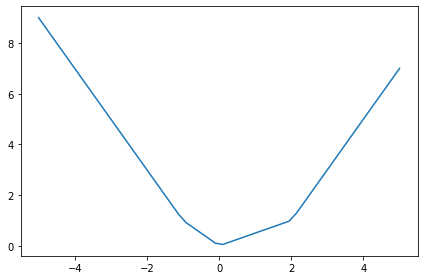

In [11]:
plt.plot(x_,y_)
plt.tight_layout()

#Seaborn

Seaborn es una biblioteca de visualización de datos construida bajo Matplotlib.

Fue construido principalmente para proporcionar un interfaz de alto nivel para dibujar gráficos estadísticos atractivos, como árboles de regresión, diagramas de caja, entre otros.

Seaborn hace que la creación de diagramas sea muy eficiente. Por lo tanto con Seaborn puede generar diagramas con un código que es 5 veces menor que con Matplotlib.

In [ ]:
import seaborn as sns

## Diagrama de dispersión con Seaborn

Como sabemos un diagrama de dispersión es un tipo de diagrama que muestra valores pertenecientes típicamente a dos variables una contra la otra.

Usualmente es una variable dependiente a ser trazada contra una variable independiente para determinar si existe alguna correlación entre las dos.

Sintaxis.

```
import seaborn as sns
reg = sns.regplot( x = 'Columna_X', y = 'Columna_Y', data = DF, color = 'Color',marker = 'Marcador', scatter_kws={'s': #})
```

Donde el valor del diccionario indica el tamaño del marcador.

Para incrementar el tamaño del gráfico tenemos la siguiente sintaxis.

```
plt.figure(figsize=(#, #))
reg = sns.regplot( x = 'Columna_X', y = 'Columna_Y', data = DF, color = 'Color',marker = 'Marcador', scatter_kws={'s': #})
```

Para añadir título y nombre a los ejes tenemos la siguiente sintaxis.

```
plt.figure(figsize=(#, #))
reg = sns.regplot( x = 'Columna_X', y = 'Columna_Y', data = DF, color = 'Color',marker = 'Marcador', scatter_kws={'s': #})
reg.set(xlabel = 'Titulo Eje X',ylabel = 'Titulo Eje Y') #Titulo de ejes
reg.set_title('Titulo') #Titulo grafico
```

Si deseamos incrementar el tamaño de los ejes y etiquetas añadimos

```
sns.set(font_scale=#)
```

Para cambiar el fondo a blanco.

```
sns.set_style('ticks')
```




***EJEMPLO***

In [ ]:
#VAMOS A REALIZAR EL MISMO GRAFICO DE DISPERSION QUE ANTERIOR HABIAMOS HECHO.

#TENEMOS ESTE DF
df_total.head()

,Year,Total
0,1980,99137
1,1981,110563
2,1982,104271
3,1983,75550
4,1984,73417


Text(0.5, 1.0, 'Dispersion anual de la inmigracion')

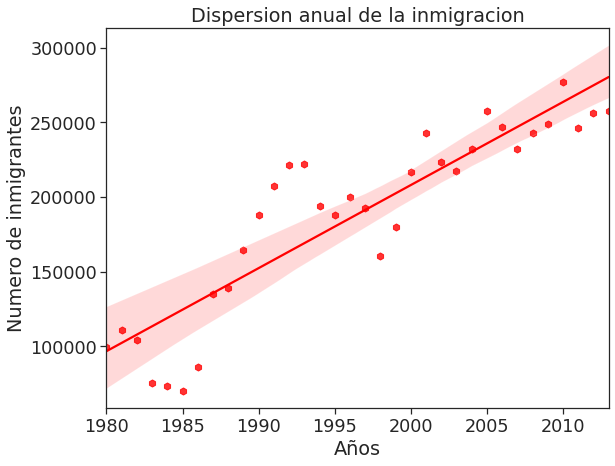

In [ ]:
#EL GRAFICO DE DISPERSION JUNTO A LA RECTA DE REGRESION Y SUS INTERVALOS DE CONFIANZA ES
plt.figure(figsize=(9, 7))
sns.set(font_scale=1.6)
sns.set_style('ticks')
reg = sns.regplot(x = 'Year',y = 'Total',data = df_total,color = 'red',marker = 'h', scatter_kws={'s': 50},ci = 99) #ci INDICA EL PORCENTAJE DEL INTERVALO DE CONFIANZA A MOSTRAR
reg.set(xlabel = 'Años',ylabel = 'Numero de inmigrantes')
reg.set_title('Dispersion anual de la inmigracion')

# Folium

Folium es una potente biblioteca de visualización de datos en Python que se creo principalmente para ayudar a las personas a visualizar datos geoespaciales.

Con Folium puedes crear un mapa de cualquier ubicación en el mundo que conozca sus valores de latitud y longitud.

También es posible crear un mapa y superponer marcadores y grupos de marcadores en la parte superior del mapa para obtener visualizaciones.

In [ ]:
import folium

## Como crear un mapa con Folium

Crear mapas con folium tiene la ventaja de que una vez graficados se puede interactuar con este.

Sintaxis.

```
mapa_mundo = folium.Map()

mapa_mundo #Para imprimir
```



***EJEMPLO***

In [ ]:
#GRAFICAMOS UN MAPA MUNDIAL

#A LA VARIABLE wordl_map LE ASIGNAMOS EL MAPA

wordl_map = folium.Map()

In [ ]:
wordl_map

## Como crear el mapa de una región en específico

Si deseamos crear el mapa de un país, lugar o región es particular necesitamos contar con anterioridad la longitud y latitud.

Sintaxis

```
map_location = folium.Map(
  location = [latitud,longitud]
)
```

Si deseamos que el mapa se muestre con un zoom inicial se agrega el parámetro



```
zoom_start = #
```

Aun con un zoom inicial, este puede ser modificado una vez mostrado el mapa.




***EJEMPLO***

In [ ]:
#IMPRIMIMOS UN MAPA DE MEXICO, MEXICO TIENE COMO LATITUD 19.4978 Y LONGITUD -99.1269

Mexico = folium.Map(
    location = [19.4978,-99.1269],
    zoom_start = 5
)

Mexico

## Como mostrar distintos estilos de mapa con Folium

Es posible presentar el mapa con distinto estilos, esto es mediante el argumento 'tiles' de la función Map.

Sintaxis.



```
map = folium.Map(tiles = 'Estilo_Deseado')
```

Se anexa el siguiente link donde se pueden encontrar distintos estilos de mapa.

[Folium Map Tiles][1]

[1]: https://deparkes.co.uk/2016/06/10/folium-map-tiles/

***EJEMPLO***

In [ ]:
#VOLVEMOS A IMPRIMIR UN MAPA DE MEXICO PERO AHORA CON UN MAPA ESTILO 'Stamen Toner'
Mexico = folium.Map(location = [19.4978,-99.1269],zoom_start = 5,tiles = 'Stamen Toner')
Mexico

In [ ]:
#VOLVEMOS A IMPRIMIR UN MAPA DE MEXICO PERO AHORA CON UN MAPA ESTILO 'Stamen Watercolor'
Mexico = folium.Map(
    location = [19.4978,-99.1269],
    zoom_start = 5,
    tiles = 'Stamen Watercolor'
)

Mexico

## Mapas con marcadores

Para agregar una marca circular alrededor de una zona en un mapa necesitamos crear algo que se denomina 'grupo de funcionalidades'.

Cuando se crea un grupo de funcionalidad, se vacía y eso significa que lo que sigue es empezar a crear lo que se conoce como 'children' y agregarlos al grupo de funcionalidad.

Sintaxis.


```
# GENERAS EL MAPA DE LA ZONA

map_zone = folium.Map(
  location = [latitud,longitud]
)

#DEFINIDO UN GRUPO DE FUNCIONALIDAD

punto = folium.map.FeatureGroup()

# DEFINIMOS EL MARCADOR

punto.add_child(
  folium.CircleMarker(
    [Latitud_marcador,Longitud_marcador],
    radius = #,
    color = 'Color',
    fill_color = 'Color'
  )
)

#AGREGAMOS EL PUNTO AL MAPA

map_zone.add_child(punto)

#IMPRIMES EL MAPA

map_zone
```





***EJEMPLO***

In [ ]:
#VAMOS A GRAFICAR EL MAPA DE MEXICO PERO PONIENDO MARCADORES EN MTY, CDMX Y YUCATAN

#DEFINIMOS EL MAPA
Mexico = folium.Map(
    location = [19.4978,-99.1269],
    zoom_start = 5,
    tiles = 'Stamen Watercolor'
)

In [ ]:
# DEFINIDO UN GRUPO DE FUNCIONALIDAD PARA MTY,CDMX Y YUCATAN
 
Puntos_Mexico = folium.map.FeatureGroup()

In [ ]:
# DEFINIMOS EL MARCADOR PARA MTY
 
Puntos_Mexico.add_child(
    folium.CircleMarker(
    [25.6714,-100.309], #LATITUD Y LONGITUD DE MTY
    radius = 5,
    color = 'blue',
    fill_color = 'red'
  )
)

#DEFINIMOS EL MARCADOR PARA CDMX

Puntos_Mexico.add_child(
  folium.CircleMarker(
    [19.49784,-99.1269], #LATITUD Y LONGITUD DE CDMX
    radius = 5,
    color = 'red',
    fill_color = 'blue'
  )
)

#DEFINIMOS EL MARCADOR PARA YUCATAN

Puntos_Mexico.add_child(
  folium.CircleMarker(
    [19.6930200,-89.0503700], #LATITUD Y LONGITUD DE YUCATAN
    radius = 5,
    color = 'yellow',
    fill_color = 'red'
  )
)

In [ ]:
#AGREGAMOS LOS PUNTOS AL MAPA

Mexico.add_child(Puntos_Mexico)

### Agregar etiquetas a los marcadores

Para añadir una etiqueta a un marcador primero lo definimos y despues añadimos el siguiente codigo.


```
folium.Marker(
  [Latitud_marcador,Longitud_marcador],
  popup = 'Texto a mostrar'
).add_to(Variable_Mapa)
```

Para ver la etiqueta haga click en la etiqueta.



***EJEMPLO***

In [ ]:
#TOMAMOS EL MAPA ANTERIOR Y LE PONEMOS ETIQUETA A LOS 3 MARCADORES
Mexico = folium.Map(
    location = [19.4978,-99.1269],
    zoom_start = 5,
    tiles = 'Stamen Watercolor'
)

#GRUPO DE FUNCIONALIDAD PARA MTY,CDMX Y YUCATAN

Puntos_Mexico = folium.map.FeatureGroup()

#MARCADOR MTY

Puntos_Mexico.add_child(
    folium.CircleMarker(
    [25.6714,-100.309], #LATITUD Y LONGITUD DE MTY
    radius = 5,
    color = 'blue',
    fill_color = 'red'
  )
)

#MARCADOR PARA CDMX

Puntos_Mexico.add_child(
  folium.CircleMarker(
    [19.49784,-99.1269], #LATITUD Y LONGITUD DE CDMX
    radius = 5,
    color = 'red',
    fill_color = 'blue'
  )
)

#MARCADOR PARA YUCATAN

Puntos_Mexico.add_child(
  folium.CircleMarker(
    [19.6930200,-89.0503700], #LATITUD Y LONGITUD DE YUCATAN
    radius = 5,
    color = 'yellow',
    fill_color = 'red'
  )
)

#AGREGAMOS LOS PUNTOS AL MAPA

Mexico.add_child(Puntos_Mexico)

#LES AGREGAMOS ETIQUETA A CADA PUNTO

#ETIQUETA A MTY

folium.Marker(
    [25.6714,-100.309],
    popup = 'Ciudad de Monterrey'
).add_to(Mexico)

#ETIQUETA A CDMX

folium.Marker(
    [19.49784,-99.1269],
    popup = 'Ciudad de México'
).add_to(Mexico)

#ETIQUETA A YUCATAN

folium.Marker(
    [19.6930200,-89.0503700],
    popup = 'Ciudad de Merida'
).add_to(Mexico)

In [ ]:
Mexico

***EJEMPLO***

Vamos a trabajar con la base de datos de los delitos ocurridos en la ciudad de San Francisco durante el año 2016 y graficaremos en el mapa los puntos de cada uno de ellos y su etiqueta.

In [ ]:
#IMPORTAMOS LA BASE DE DATOS
df_delitos = pd.read_csv('https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DV0101EN/labs/Data_Files/Police_Department_Incidents_-_Previous_Year__2016_.csv')

In [ ]:
df_delitos.head(3)

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,04/25/2016 12:00:00 AM,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010


Describimos las columnas.

> 1.  **IncidntNum (NúmIncidnt)**: Número de incidente
> 2.  **Category (Categoría)**: Categoría del delito o del incidente 
> 3.  **Descript (Descrip)**: Descripción del delito o del incidente 
> 4.  **DayOfWeek (DíaDeLaSemana)**: El día de la semana en que ocurrió el incidente 
> 5.  **Date (Fecha)**: La fecha en que ocurrió el incidente 
> 6.  **Time (Hora)**: La hora del día en que ocurrió el incidente 
> 7.  **PdDistrict (DistritoDp)**: El distrito del departamento de policía 
> 8.  **Resolution (Resolución)**: La resolución del delito en términos del arresto o no del perpetrador
> 9.  **Address (Dirección)**: La dirección más cercana al lugar donde ocurrió el incidente 
> 10. **X**: El valor de la longitud de la ubicación del delito 
> 11. **Y**: El valor de la latitud de la ubicación del delito 
> 12. **Location (Ubicación)**: El lugar donde coinciden los valores de latitud y longitud 
> 13. **PdId (IdDp)**: El id. del departamento de policía 

In [ ]:
#ANALIZAMOS EL DF

df_delitos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150500 entries, 0 to 150499
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   IncidntNum  150500 non-null  int64  
 1   Category    150500 non-null  object 
 2   Descript    150500 non-null  object 
 3   DayOfWeek   150500 non-null  object 
 4   Date        150500 non-null  object 
 5   Time        150500 non-null  object 
 6   PdDistrict  150499 non-null  object 
 7   Resolution  150500 non-null  object 
 8   Address     150500 non-null  object 
 9   X           150500 non-null  float64
 10  Y           150500 non-null  float64
 11  Location    150500 non-null  object 
 12  PdId        150500 non-null  int64  
dtypes: float64(2), int64(2), object(9)
memory usage: 14.9+ MB


In [ ]:
#PARA UN USO MERAMENTE EDUCATIVO SOLAMENTE SELECCIONAREMOS 1000 FILAS

df_delitos = df_delitos.iloc[:1000]

In [ ]:
#VISUALIZAMOS EL MAPA DE SAN FRANCISCO

SF_Mapa = folium.Map(location = [37.77,-122.40],zoom_start = 12)

SF_Mapa

In [ ]:
#MARCAREMOS CON PUNTOS TODOS LOS DELITOS REGISTRADOS EN NUESTRA BASE DE DATOS, LIMITADA A 100.

#PRIMERO DEFINIMOS EL GRUPO DE FUNCIONALIDAD

Delitos_SF = folium.map.FeatureGroup()

In [ ]:
#PARA IR AGREGANDO CADA UNO DE LOS MARCADORES NECESITAMOS UN CICLO for

for i in range (len(df_delitos.loc[:,'X'])):
  Delitos_SF.add_child(
      folium.CircleMarker([df_delitos.loc[:,'Y'][i],df_delitos.loc[:,'X'][i]],
      radius = 5,
      color = 'gold',
      fill = True,
      fill_color = 'red')
  )

#AGREGAMOS LOS PUNTOS AL MAPA

SF_Mapa.add_child(Delitos_SF)

In [ ]:
#VAMOS AHORA AGREGAR ETIQUETAS

for i in range (len(df_delitos.loc[:,'X'])):
  Delitos_SF.add_child(
      folium.CircleMarker([df_delitos.loc[:,'Y'][i],df_delitos.loc[:,'X'][i]],
      radius = 5,
      color = 'gold',
      fill = True,
      fill_color = 'red')
  )

SF_Mapa.add_child(Delitos_SF)

#CONVERTIMOS A LISTA CADA UNO DE LOS ELEMENTOS A AGREGAR

latitud = list(df_delitos.loc[:,'Y'])
longitud = list(df_delitos.loc[:,'X'])
Texto = list(df_delitos.loc[:,'Category'])

for j in range (len(latitud)):
  folium.Marker([latitud[j], longitud[j]], popup = Texto[j]).add_to(SF_Mapa)

In [ ]:
#GRAFICAMOS

SF_Mapa

In [ ]:
#NOTE QUE EL GRAFICO ANTERIOR ESTA ABARROTADO DE ETIQUETAS, SI DESEAMOS SEGUIR TENIENDO
#LAS ETIQUETAS PERO NO EL SIMBOLO DE ETIQUETA ENTONCES UNA SOLUCION ES QUE AL AGREGAR
#EL MARCADOR INDIQUEMOS QUIENES SON LA ETIQUETAS DE CADA MARCADOR

#NOTE QUE VOLVEMOS A DEFINIR EL MAPA PARA QUE SURTA EFECTO

SF_Mapa = folium.Map(location = [37.77,-122.40],zoom_start = 12)

Delitos_SF = folium.map.FeatureGroup()

for i in range (len(df_delitos.loc[:,'X'])):
  Delitos_SF.add_child(
      folium.CircleMarker([df_delitos.loc[:,'Y'][i],df_delitos.loc[:,'X'][i]],
      radius = 5,
      color = 'blue',
      fill = True,
      popup = df_delitos.loc[:,'Category'][i], #AQUI ES DONDE AGREGAMOS LA ETIQUETA
      fill_color = 'red')
  )

SF_Mapa.add_child(Delitos_SF)

La otra solución adecuada es agrupar los marcadores, utilizando la idea de **Diagramas de Voronoi**. Cada grupo se representa con la cantidad de delitos en cada vecindario. Los grupos pueden considerarse porciones de San Francisco que pueden analizarse por separado.

Para implementarlo, instanciamos un objeto MarkerCluster y agregamos todos los puntos de datos del DataFrame en este objeto.

In [ ]:
#PRIMERO IMPORTAMOS LA FUNCION plugins
from folium import plugins

In [ ]:
#REESCRIBIMOS EL MAPA
SF_Mapa = folium.Map(location = [37.77,-122.40],zoom_start = 12)

#AGREGAMOS TODOS LOS ELEMENTOS A Delitos
Delitos = plugins.MarkerCluster().add_to(SF_Mapa)

#AGREGAMOS LOS PUNTOS 
latitud = list(df_delitos.loc[:,'Y'])
longitud = list(df_delitos.loc[:,'X'])
Texto = list(df_delitos.loc[:,'Category'])

for j in range (len(latitud)):
  folium.Marker([latitud[j], longitud[j]], 
                icon = None, #NO AGREGAMOS ICONOS
                popup = Texto[j]).add_to(Delitos) #LOS AGREGAMOS A Delitos

#GRAFICAMOS EL MAPA

SF_Mapa

***NOTA*** : Pruebe acercarse y alejarse del mapa anterior, notará que las agrupaciones se juntan y se separan entre mas te alejas y te acercas, respectivamente.

## Mapas coropléticas (Choropleth Maps)

Un mapa coroplético es un mapa temático en el que las áreas están sombreadas o modeladas en proporción a la medición de la variable estadística que está siendo mostrada en el mapa.

Por ejemplo, densidad poblacional o ingreso per cápita.

Para crear un mapa coroplético de una región de interés, Folium requiere de un archivo **Geo JSON** que incluya datos geoespaciales de la región.

Para crear un mapa coroplético del mundo, necesitamos un archivo **Geo JSON** que enumere cada país junto con cualquier información geoespacial para definir sus fronteras y límites.

A continuación mostraremos un ejemplo y los pasos a realizar para crear un mapa coroplético.

In [ ]:
#RECORDEMOS EL DATA FRAME DE df_canada QUE MUESTRA LA INMIGRACION A CANADA
df_canada.head()

,Continent,Region,DevName,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Afghanistan,Asia,Southern Asia,Developing regions,16,39,39,47,71,340,496,741,828,1076,1028,1378,1170,713,858,1537,2212,2555,1999,2395,3326,4067,3697,3479,2978,3436,3009,2652,2111,1746,1758,2203,2635,2004,58639
Albania,Europe,Southern Europe,Developed regions,1,0,0,0,0,0,1,2,2,3,3,21,56,96,71,63,113,307,574,1264,1816,1602,1021,853,1450,1223,856,702,560,716,561,539,620,603,15699
Algeria,Africa,Northern Africa,Developing regions,80,67,71,69,63,44,69,132,242,434,491,872,795,717,595,1106,2054,1842,2292,2389,2867,3418,3406,3072,3616,3626,4807,3623,4005,5393,4752,4325,3774,4331,69439
American Samoa,Oceania,Polynesia,Developing regions,0,1,0,0,0,0,0,1,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,6
Andorra,Europe,Southern Europe,Developed regions,0,0,0,0,0,0,2,0,0,0,3,0,1,0,0,0,0,0,2,0,0,1,0,2,0,0,1,1,0,0,0,0,1,1,15


In [ ]:
#CONVERTIMOS A COLUMNAS LOS INDICES
df_canada = df_canada.reset_index()
df_canada.head()

,index,Continent,Region,DevName,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
0,Afghanistan,Asia,Southern Asia,Developing regions,16,39,39,47,71,340,496,741,828,1076,1028,1378,1170,713,858,1537,2212,2555,1999,2395,3326,4067,3697,3479,2978,3436,3009,2652,2111,1746,1758,2203,2635,2004,58639
1,Albania,Europe,Southern Europe,Developed regions,1,0,0,0,0,0,1,2,2,3,3,21,56,96,71,63,113,307,574,1264,1816,1602,1021,853,1450,1223,856,702,560,716,561,539,620,603,15699
2,Algeria,Africa,Northern Africa,Developing regions,80,67,71,69,63,44,69,132,242,434,491,872,795,717,595,1106,2054,1842,2292,2389,2867,3418,3406,3072,3616,3626,4807,3623,4005,5393,4752,4325,3774,4331,69439
3,American Samoa,Oceania,Polynesia,Developing regions,0,1,0,0,0,0,0,1,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,6
4,Andorra,Europe,Southern Europe,Developed regions,0,0,0,0,0,0,2,0,0,0,3,0,1,0,0,0,0,0,2,0,0,1,0,2,0,0,1,1,0,0,0,0,1,1,15


In [ ]:
df_canada.rename(columns = {'index':'Country'}, inplace = True)
df_canada.head()

,Country,Continent,Region,DevName,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
0,Afghanistan,Asia,Southern Asia,Developing regions,16,39,39,47,71,340,496,741,828,1076,1028,1378,1170,713,858,1537,2212,2555,1999,2395,3326,4067,3697,3479,2978,3436,3009,2652,2111,1746,1758,2203,2635,2004,58639
1,Albania,Europe,Southern Europe,Developed regions,1,0,0,0,0,0,1,2,2,3,3,21,56,96,71,63,113,307,574,1264,1816,1602,1021,853,1450,1223,856,702,560,716,561,539,620,603,15699
2,Algeria,Africa,Northern Africa,Developing regions,80,67,71,69,63,44,69,132,242,434,491,872,795,717,595,1106,2054,1842,2292,2389,2867,3418,3406,3072,3616,3626,4807,3623,4005,5393,4752,4325,3774,4331,69439
3,American Samoa,Oceania,Polynesia,Developing regions,0,1,0,0,0,0,0,1,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,6
4,Andorra,Europe,Southern Europe,Developed regions,0,0,0,0,0,0,2,0,0,0,3,0,1,0,0,0,0,0,2,0,0,1,0,2,0,0,1,1,0,0,0,0,1,1,15


In [ ]:
#NECESITAMOS EN PRIMERA INSTANCIA UN ARCHIVO Geo JSON QUE DELIMITE, EN NUESTRO CASO PARTICULAR,
#LOS ESTADOS Y PAISES. EN FUNCION DE LA NECESIDAD DESEADA, EL Geo JSON SIRVE PARA DELIMITAR UN AREA O EL GLOBO

#DESCARGAMOS EL Geo JSON

!wget --quiet https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DV0101EN/labs/Data_Files/world_countries.json -O world_countries.json

In [ ]:
#EL ARCHIVO Geo JSON LO ASIGNAMOS A wordl_geo

world_geo = r'world_countries.json'

In [ ]:
#CREAMOS UN MAPA

mapamundi = folium.Map(zoom_start = 2, location = [0,0])

In [ ]:
#LE APLICAMOS EL COROPLETICO

mapamundi.choropleth(
    geo_data = world_geo, 
    data = df_canada,
    columns = ['Country','Total'],
    key_on = 'feature.properties.name',
    fill_color = 'YlOrRd',
    legend_name = 'Inmigration to Canada',
)

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [ ]:
#IMPRIMIMOS EL MAPA

mapamundi

Para obtener la versión actualizada, visitar el siguiente link.

[GeoJSON and choropleth][1]

[1]: https://github.com/python-visualization/folium/blob/master/examples/GeoJSON_and_choropleth.ipynb